# **State Wise Water Quality Analysis and Forecasting in India (2012–2024)**

In [10]:
!pip install folium requests pandas geopandas


Defaulting to user installation because normal site-packages is not writeable



[notice] A new release of pip is available: 24.3.1 -> 25.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [18]:
!pip install prophet


Defaulting to user installation because normal site-packages is not writeable



[notice] A new release of pip is available: 24.3.1 -> 25.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler
from statsmodels.tsa.holtwinters import ExponentialSmoothing

df = pd.read_csv("water_quality_india_2012_2024_with_coords.csv")

scaler = MinMaxScaler()
df[['pH', 'BOD (mg/L)', 'DO (mg/L)', 'Conductivity (µS/cm)', 'Coliform (MPN/100ml)']] = scaler.fit_transform(
    df[['pH', 'BOD (mg/L)', 'DO (mg/L)', 'Conductivity (µS/cm)', 'Coliform (MPN/100ml)']]
)

# Convert 'Year' to categorical for grouping
df['Year'] = df['Year'].astype(int)


# 1. **Year-Wise Trend Analysis**

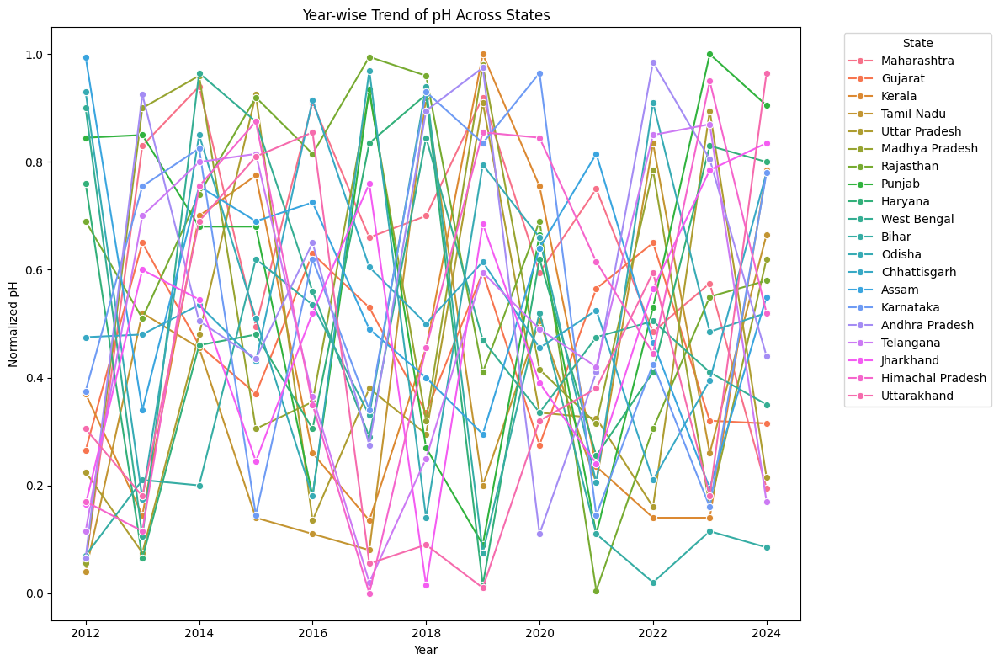

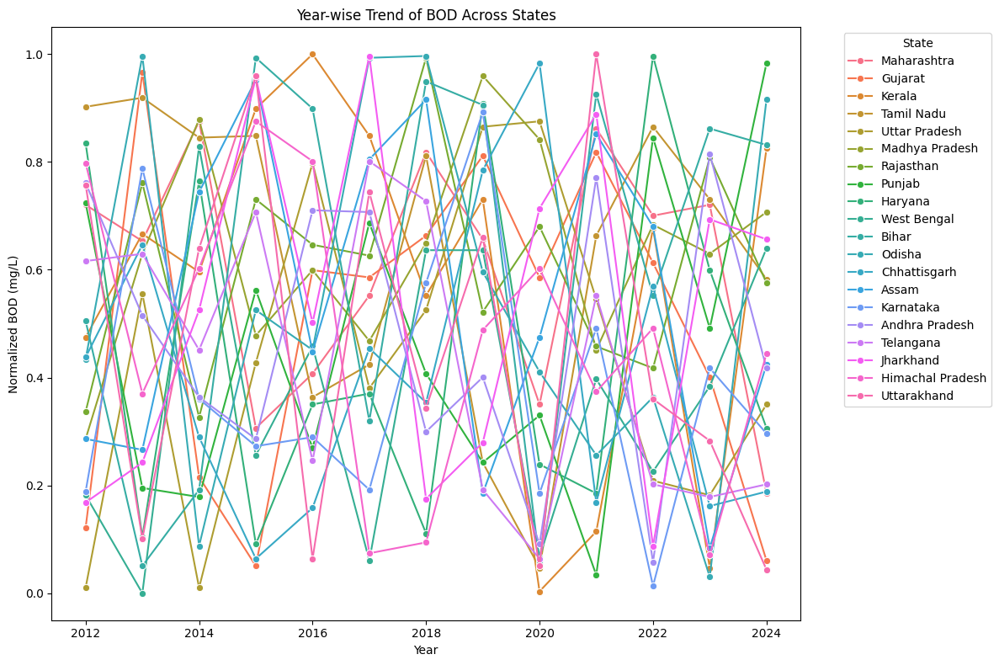

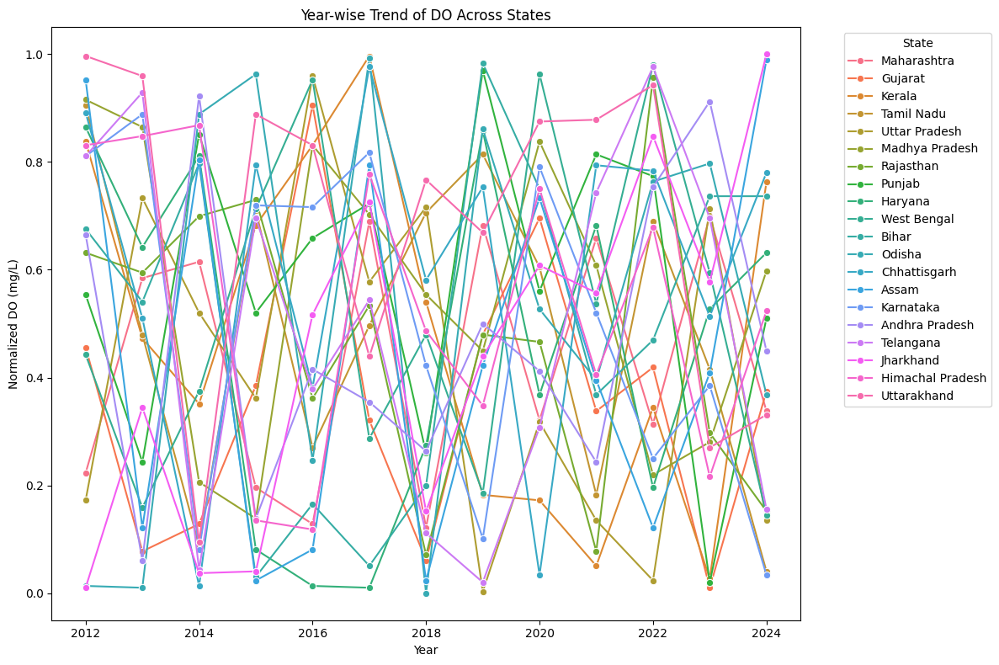

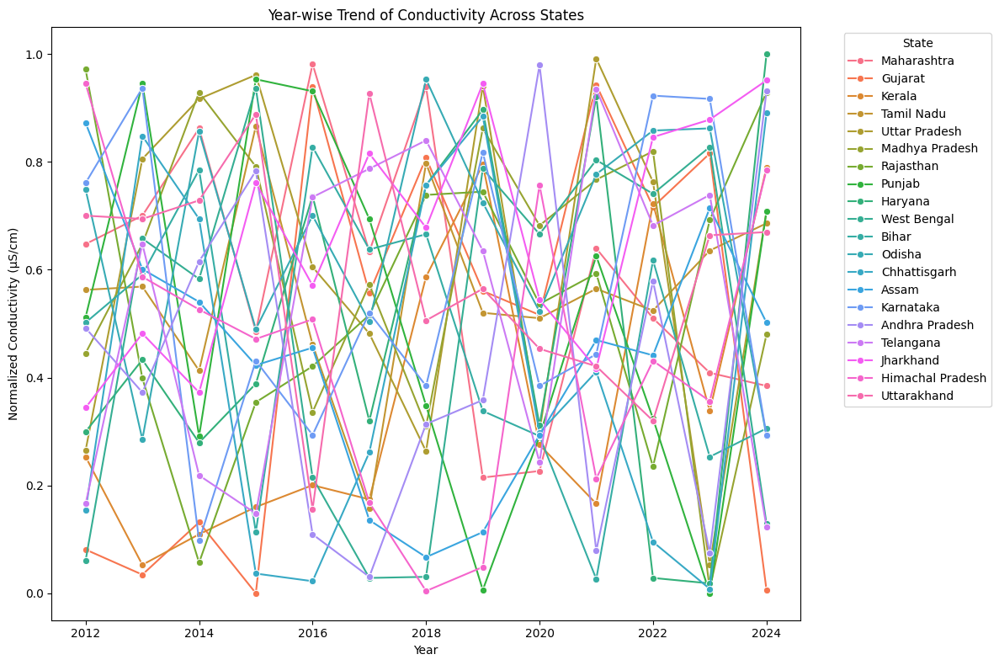

In [2]:
# 1. **Year-Wise Trend Analysis**
plt.figure(figsize=(12, 8))
sns.lineplot(data=df, x="Year", y="pH", hue="State", marker="o")
plt.title("Year-wise Trend of pH Across States")
plt.xlabel("Year")
plt.ylabel("Normalized pH")
plt.legend(title="State", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

plt.figure(figsize=(12, 8))
sns.lineplot(data=df, x="Year", y="BOD (mg/L)", hue="State", marker="o")
plt.title("Year-wise Trend of BOD Across States")
plt.xlabel("Year")
plt.ylabel("Normalized BOD (mg/L)")
plt.legend(title="State", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

plt.figure(figsize=(12, 8))
sns.lineplot(data=df, x="Year", y="DO (mg/L)", hue="State", marker="o")
plt.title("Year-wise Trend of DO Across States")
plt.xlabel("Year")
plt.ylabel("Normalized DO (mg/L)")
plt.legend(title="State", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

plt.figure(figsize=(12, 8))
sns.lineplot(data=df, x="Year", y="Conductivity (µS/cm)", hue="State", marker="o")
plt.title("Year-wise Trend of Conductivity Across States")
plt.xlabel("Year")
plt.ylabel("Normalized Conductivity (µS/cm)")
plt.legend(title="State", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()



# 2. **State-Wise Comparison (latest year 2024)**

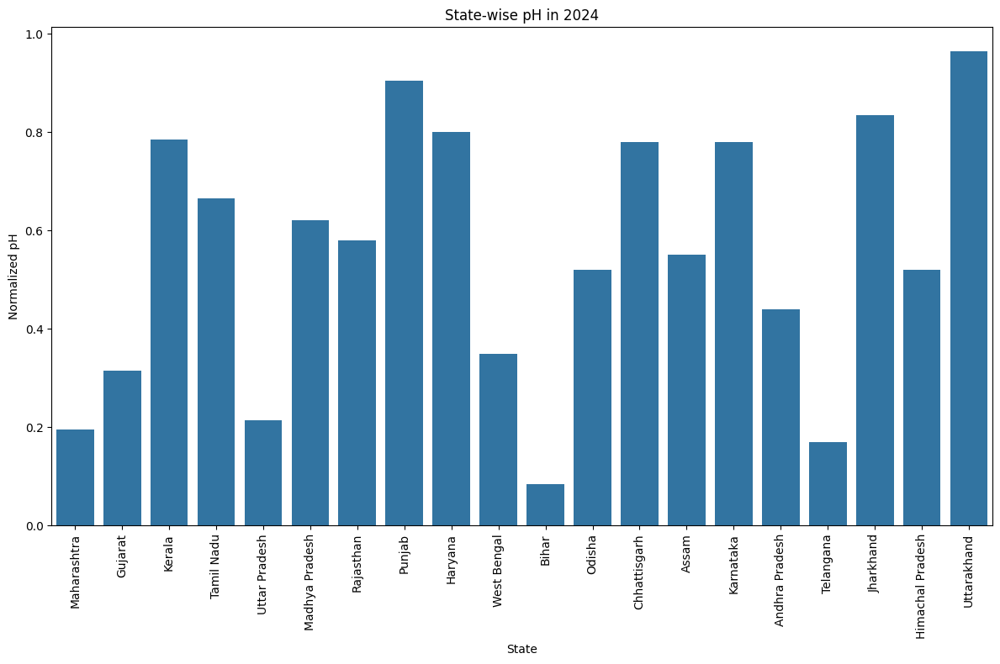

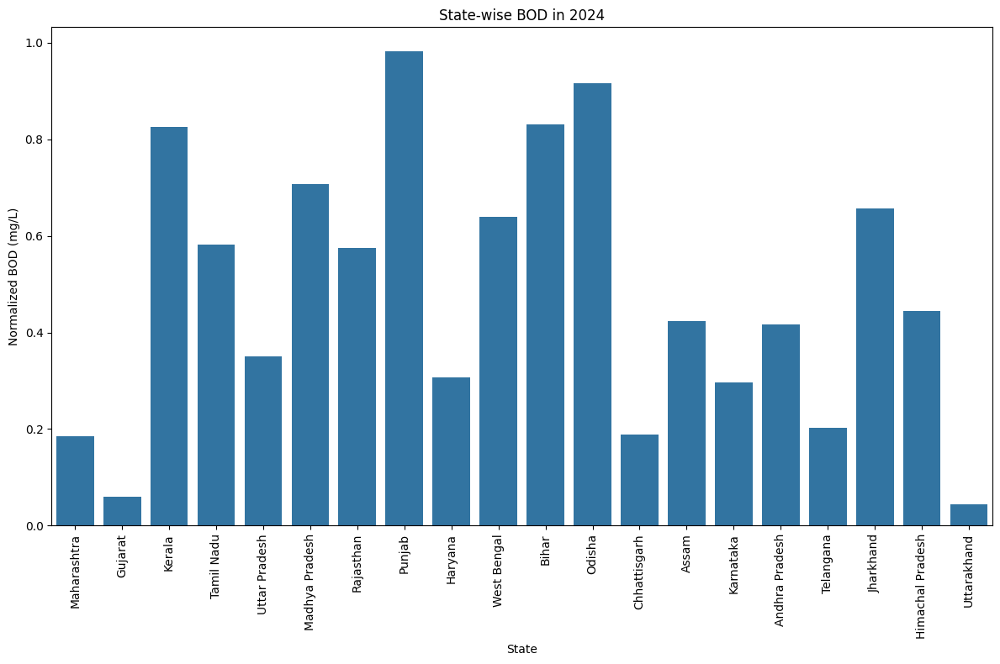

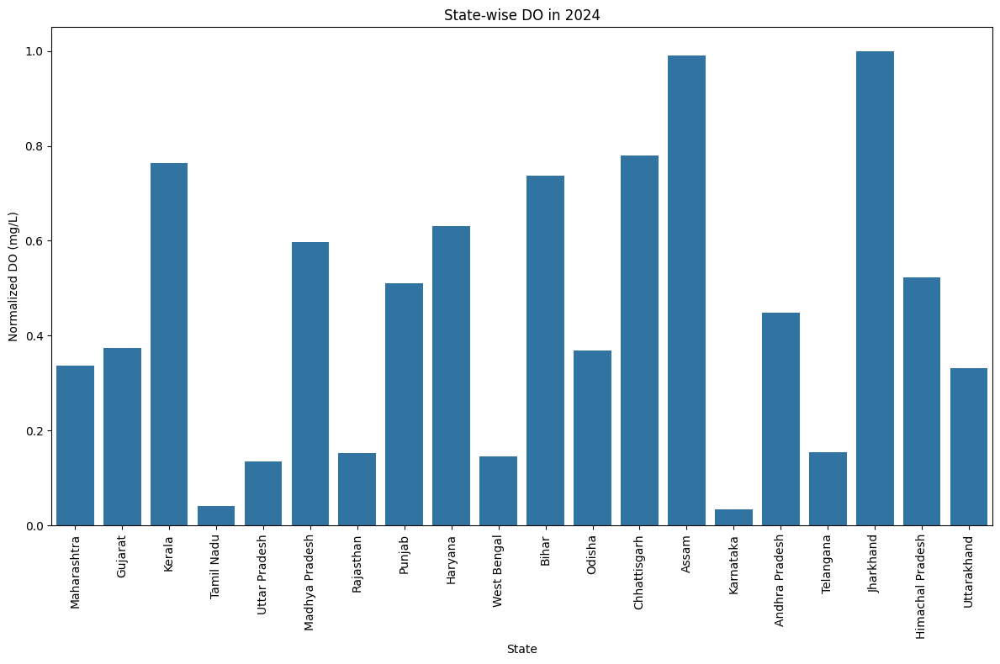

In [4]:
# 2. **State-Wise Comparison (latest year 2012)**
state_2024 = df[df['Year'] == 2024]
plt.figure(figsize=(12, 8))
sns.barplot(data=state_2024, x="State", y="pH")
plt.title("State-wise pH in 2024")
plt.xticks(rotation=90)
plt.ylabel("Normalized pH")
plt.tight_layout()
plt.show()

plt.figure(figsize=(12, 8))
sns.barplot(data=state_2024, x="State", y="BOD (mg/L)")
plt.title("State-wise BOD in 2024")
plt.xticks(rotation=90)
plt.ylabel("Normalized BOD (mg/L)")
plt.tight_layout()
plt.show()

plt.figure(figsize=(12, 8))
sns.barplot(data=state_2024, x="State", y="DO (mg/L)")
plt.title("State-wise DO in 2024")
plt.xticks(rotation=90)
plt.ylabel("Normalized DO (mg/L)")
plt.tight_layout()
plt.show()



# 3. **Threshold Analysis**

In [5]:

thresholds = {
    'pH': (6.5, 8.5),
    'BOD (mg/L)': (0, 3),
    'DO (mg/L)': (5, 9),
    'Coliform (MPN/100ml)': (0, 500)  # Safe Coliform levels (less than 500)
}

# Apply thresholds and analyze the data
for param, (low, high) in thresholds.items():
    unsafe_data = df[(df[param] < low) | (df[param] > high)]
    print(f"Number of unsafe values for {param}: {len(unsafe_data)}")

Number of unsafe values for pH: 260
Number of unsafe values for BOD (mg/L): 0
Number of unsafe values for DO (mg/L): 260
Number of unsafe values for Coliform (MPN/100ml): 0


# 4. **Correlation Analysis**

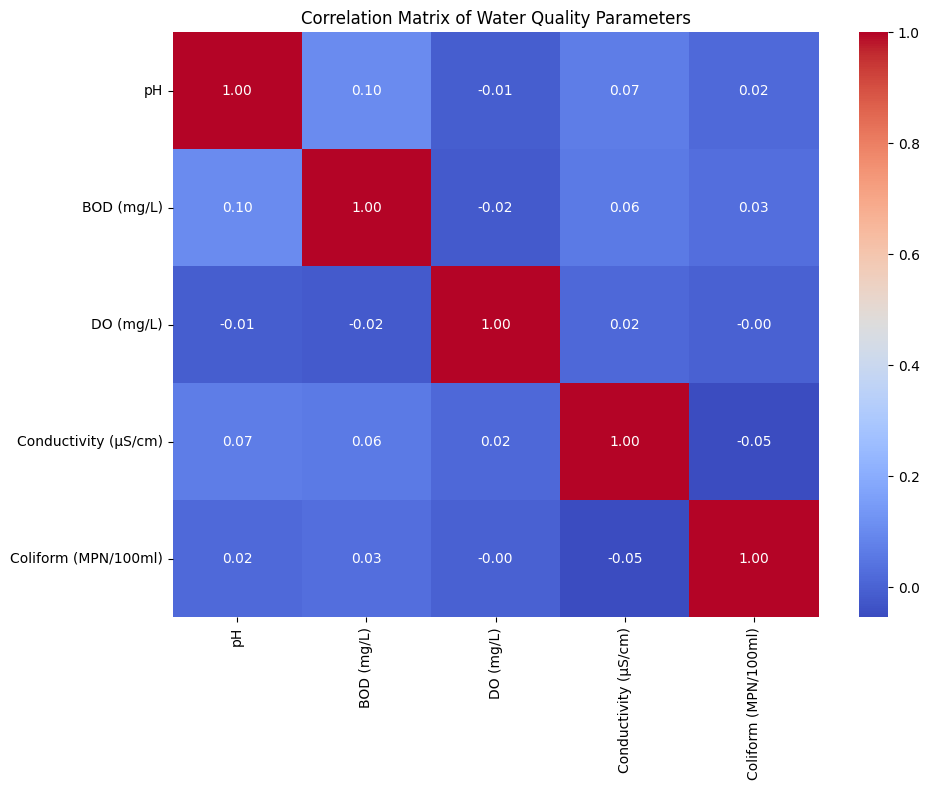

In [6]:

plt.figure(figsize=(10, 8))
correlation_matrix = df[['pH', 'BOD (mg/L)', 'DO (mg/L)', 'Conductivity (µS/cm)', 'Coliform (MPN/100ml)']].corr()
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Correlation Matrix of Water Quality Parameters")
plt.tight_layout()
plt.show()

# 5. **Coliform Analysis (Separate)**

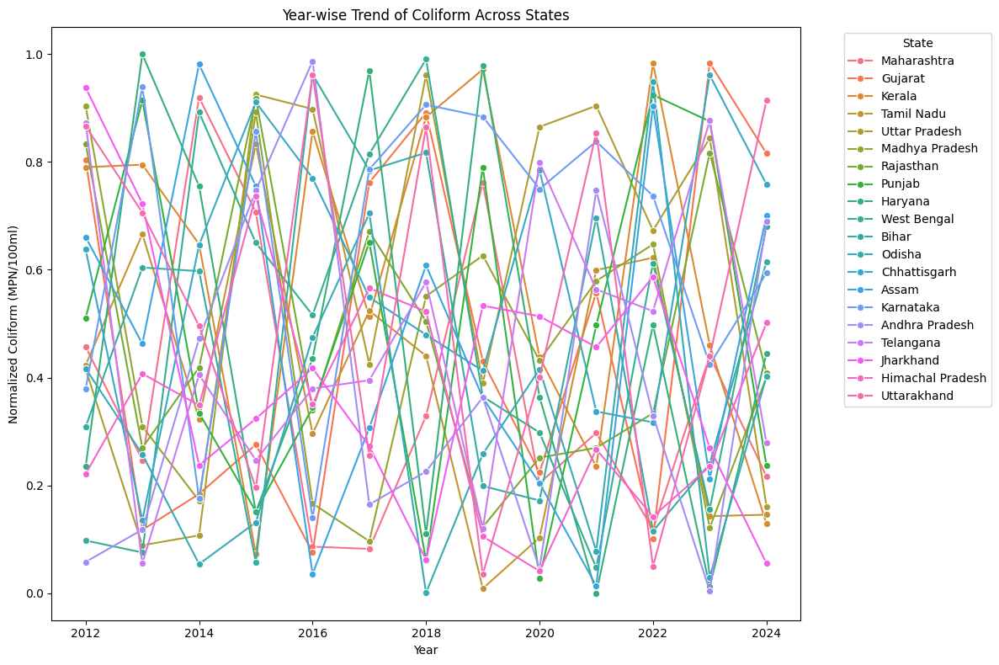

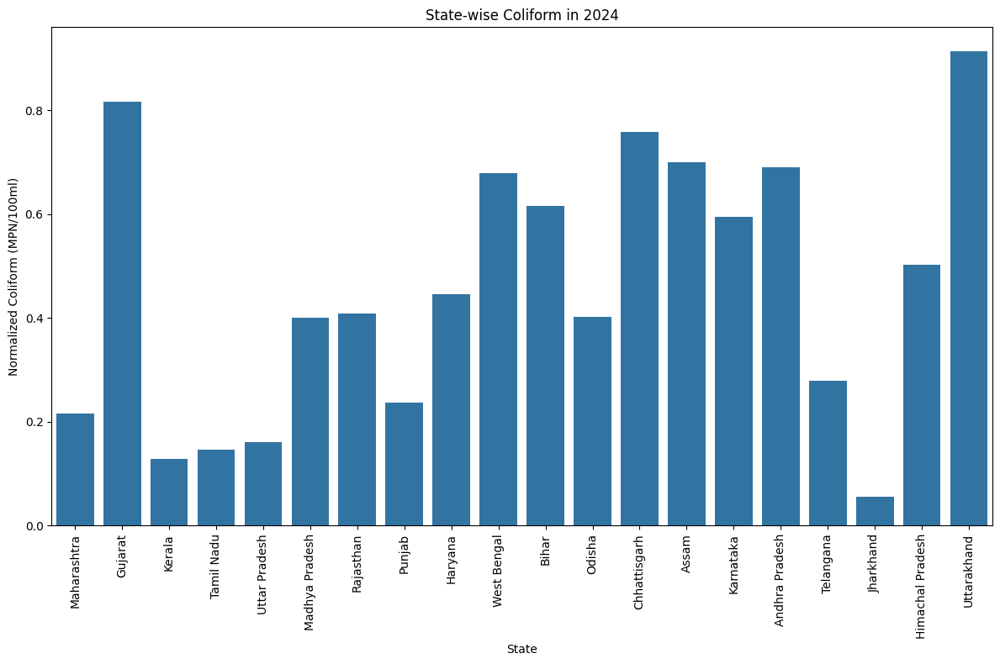

In [12]:
plt.figure(figsize=(12, 8))
sns.lineplot(data=df, x="Year", y="Coliform (MPN/100ml)", hue="State", marker="o")
plt.title("Year-wise Trend of Coliform Across States")
plt.xlabel("Year")
plt.ylabel("Normalized Coliform (MPN/100ml)")
plt.legend(title="State", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

# State-wise Coliform comparison (2024)
plt.figure(figsize=(12, 8))
sns.barplot(data=state_2024, x="State", y="Coliform (MPN/100ml)")
plt.title("State-wise Coliform in 2024")
plt.xticks(rotation=90)
plt.ylabel("Normalized Coliform (MPN/100ml)")
plt.tight_layout()
plt.show()


# 6. **Time Series Forecasting for pH, BOD, DO, Conductivity**

- PH

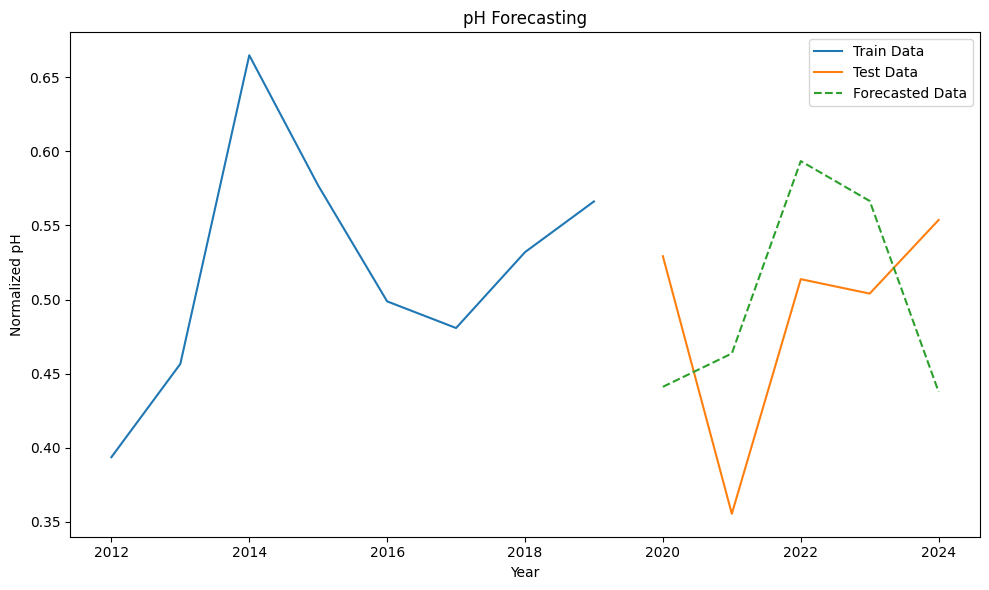

In [13]:

df_pH = df[['Year', 'pH']].groupby('Year').mean().reset_index()
train_pH = df_pH[df_pH['Year'] < 2020]
test_pH = df_pH[df_pH['Year'] >= 2020]

model_pH = ExponentialSmoothing(train_pH['pH'], trend="add", seasonal="add", seasonal_periods=4)
model_pH_fit = model_pH.fit()
forecast_pH = model_pH_fit.forecast(len(test_pH))

plt.figure(figsize=(10, 6))
plt.plot(train_pH['Year'], train_pH['pH'], label='Train Data')
plt.plot(test_pH['Year'], test_pH['pH'], label='Test Data')
plt.plot(test_pH['Year'], forecast_pH, label='Forecasted Data', linestyle='--')
plt.title("pH Forecasting")
plt.xlabel("Year")
plt.ylabel("Normalized pH")
plt.legend()
plt.tight_layout()
plt.show()

# 1. **State-Wise Trend Analysis (2012 to 2024)**

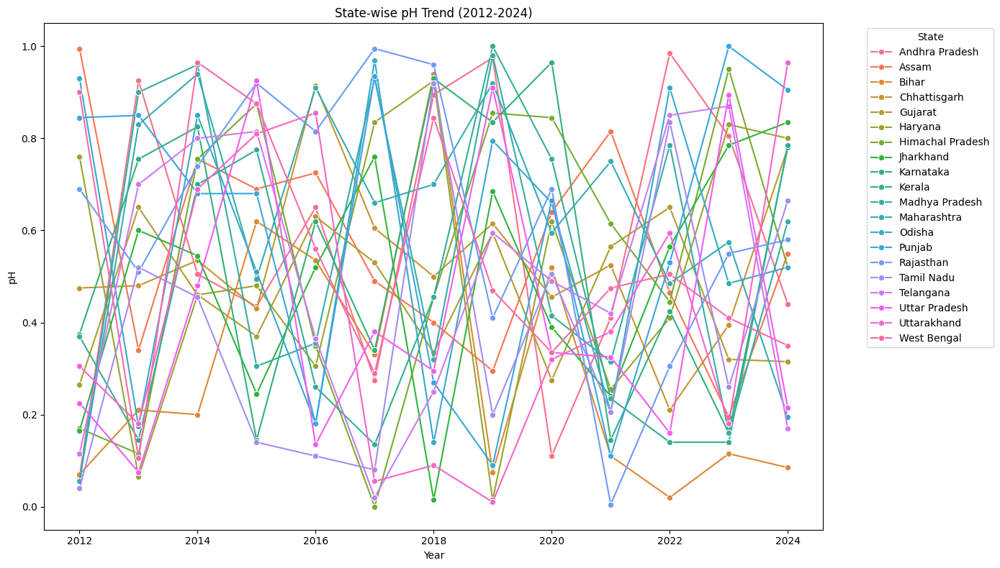

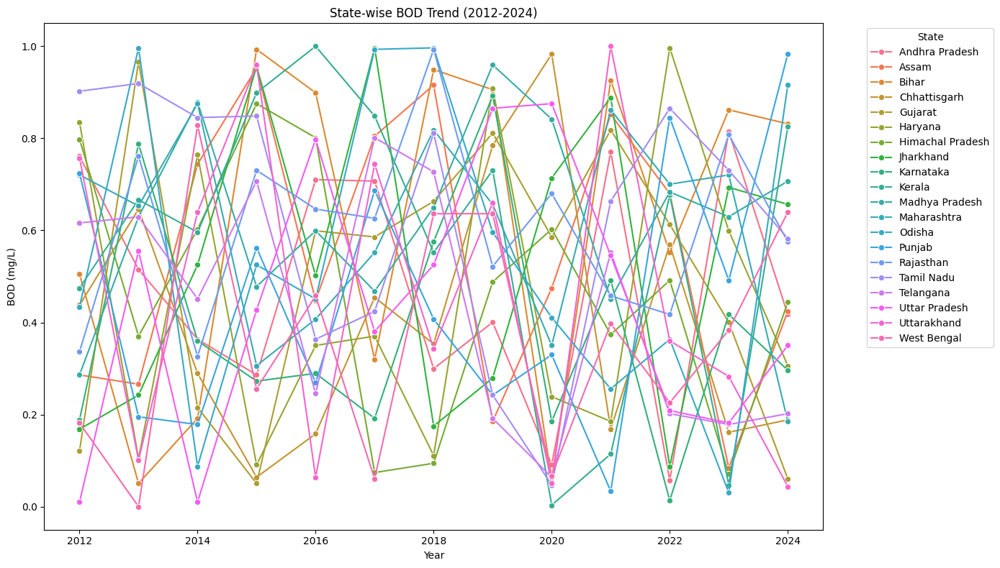

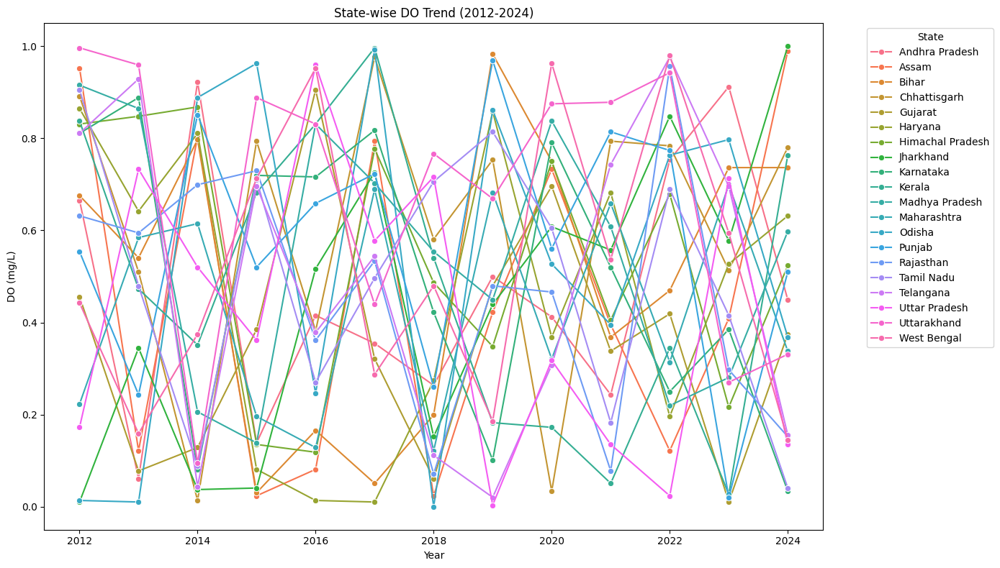

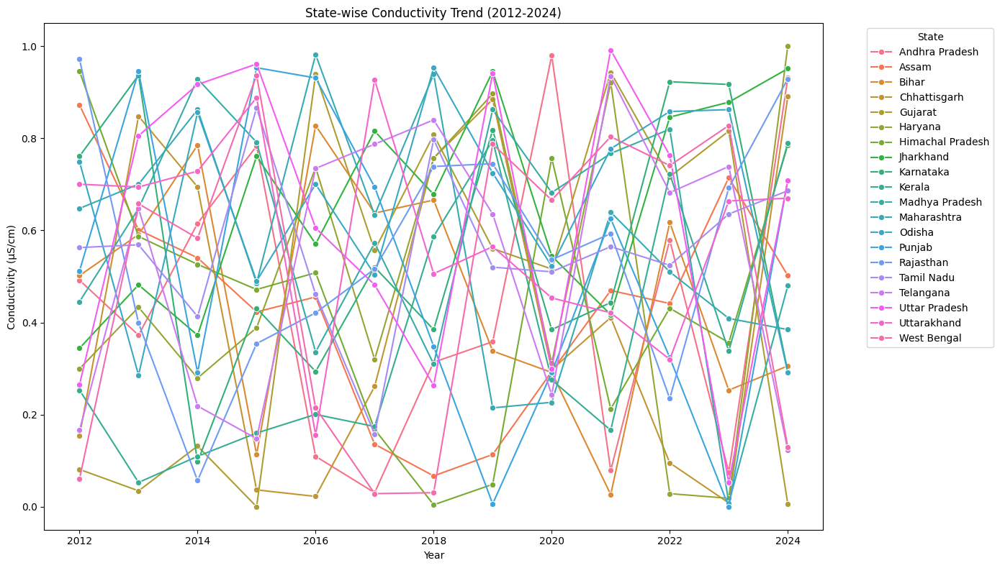

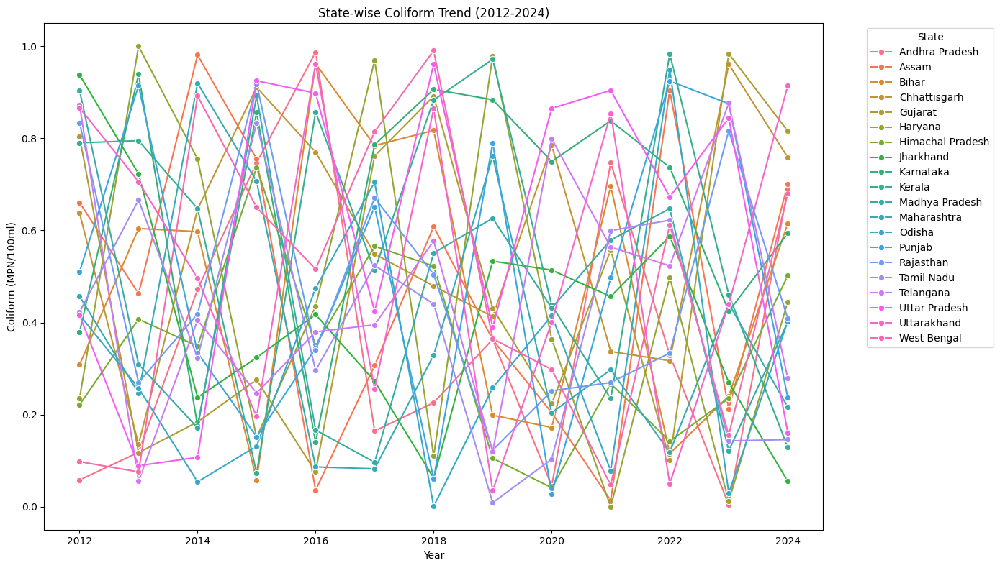

In [17]:
# pH trend across states
plt.figure(figsize=(14, 8))
sns.lineplot(data=state_yearly_avg, x="Year", y="pH", hue="State", marker="o")
plt.title("State-wise pH Trend (2012-2024)")
plt.xlabel("Year")
plt.ylabel("pH")
plt.legend(title="State", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

# BOD trend across states
plt.figure(figsize=(14, 8))
sns.lineplot(data=state_yearly_avg, x="Year", y="BOD (mg/L)", hue="State", marker="o")
plt.title("State-wise BOD Trend (2012-2024)")
plt.xlabel("Year")
plt.ylabel("BOD (mg/L)")
plt.legend(title="State", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

# DO trend across states
plt.figure(figsize=(14, 8))
sns.lineplot(data=state_yearly_avg, x="Year", y="DO (mg/L)", hue="State", marker="o")
plt.title("State-wise DO Trend (2012-2024)")
plt.xlabel("Year")
plt.ylabel("DO (mg/L)")
plt.legend(title="State", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

# Conductivity trend across states
plt.figure(figsize=(14, 8))
sns.lineplot(data=state_yearly_avg, x="Year", y="Conductivity (µS/cm)", hue="State", marker="o")
plt.title("State-wise Conductivity Trend (2012-2024)")
plt.xlabel("Year")
plt.ylabel("Conductivity (µS/cm)")
plt.legend(title="State", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

# Coliform trend across states
plt.figure(figsize=(14, 8))
sns.lineplot(data=state_yearly_avg, x="Year", y="Coliform (MPN/100ml)", hue="State", marker="o")
plt.title("State-wise Coliform Trend (2012-2024)")
plt.xlabel("Year")
plt.ylabel("Coliform (MPN/100ml)")
plt.legend(title="State", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()




# 2. **Forecasting (Holt-Winters Exponential Smoothing)**

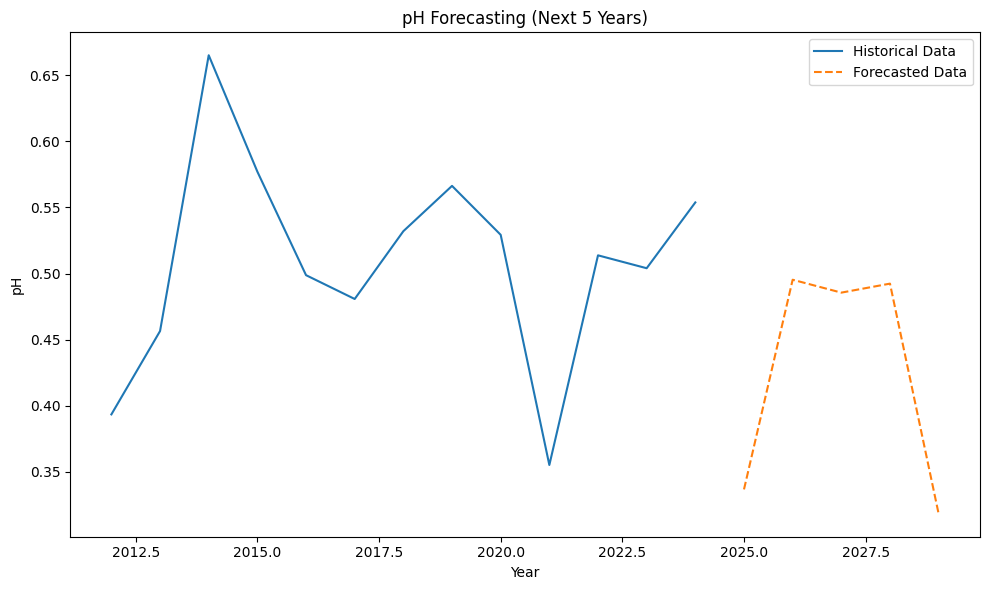

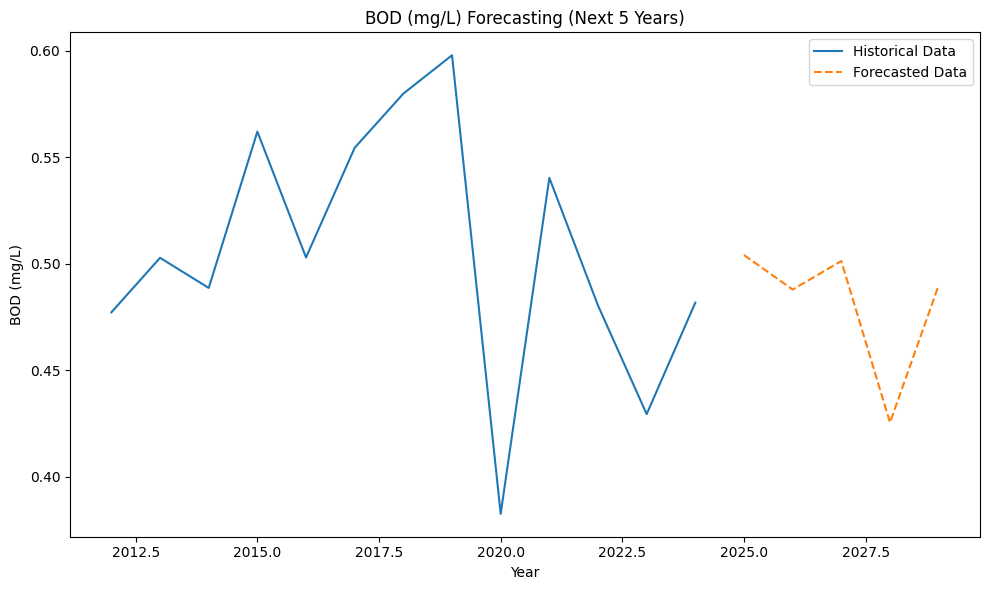

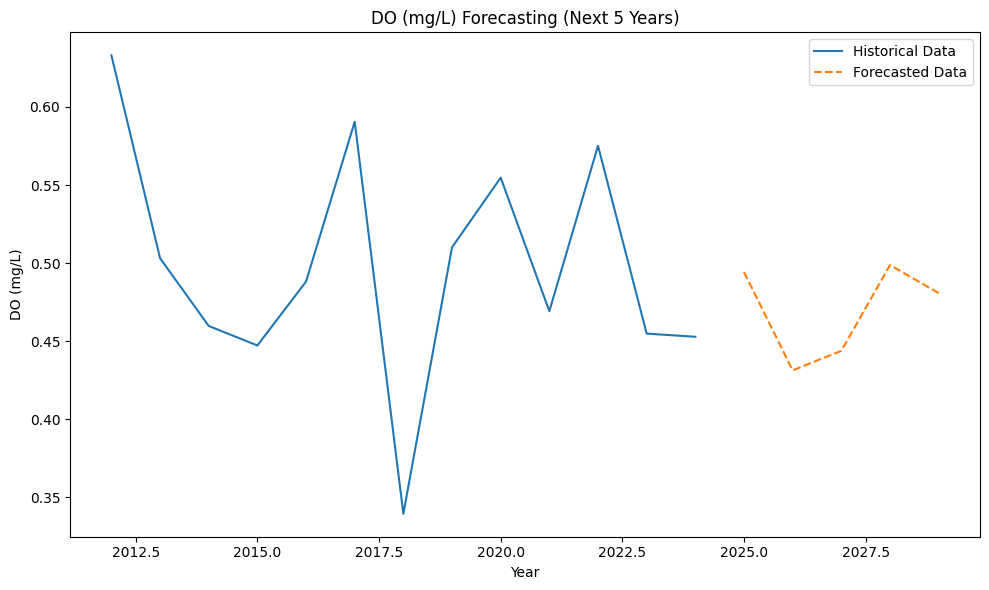

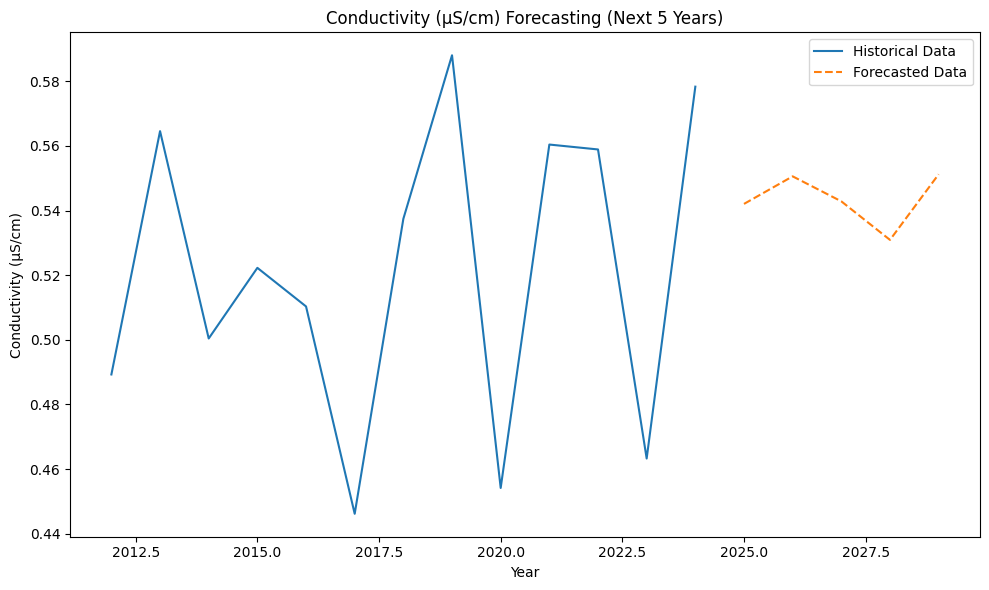

In [18]:

# Example for pH forecasting

# Function to apply Holt-Winters forecasting for each parameter
def forecast_parameter(data, parameter, years_to_forecast=5):
    # Prepare the data: group by Year and calculate mean for the parameter
    df_param = data[['Year', parameter]].groupby('Year').mean().reset_index()
    
    # Fit the Holt-Winters model
    model = ExponentialSmoothing(df_param[parameter], trend="add", seasonal="add", seasonal_periods=4)
    model_fit = model.fit()
    
    # Forecast for the next 'years_to_forecast' years
    forecast = model_fit.forecast(years_to_forecast)
    
    # Plot the forecast
    plt.figure(figsize=(10, 6))
    plt.plot(df_param['Year'], df_param[parameter], label='Historical Data')
    plt.plot(range(df_param['Year'].iloc[-1] + 1, df_param['Year'].iloc[-1] + years_to_forecast + 1), forecast, label='Forecasted Data', linestyle='--')
    plt.title(f"{parameter} Forecasting (Next {years_to_forecast} Years)")
    plt.xlabel("Year")
    plt.ylabel(parameter)
    plt.legend()
    plt.tight_layout()
    plt.show()

# Forecasting for each parameter: pH, BOD, DO, Conductivity
forecast_parameter(state_yearly_avg, 'pH', years_to_forecast=5)
forecast_parameter(state_yearly_avg, 'BOD (mg/L)', years_to_forecast=5)
forecast_parameter(state_yearly_avg, 'DO (mg/L)', years_to_forecast=5)
forecast_parameter(state_yearly_avg, 'Conductivity (µS/cm)', years_to_forecast=5)


# Visualize distribution of each parameter to understand their spread

In [32]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, accuracy_score
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error

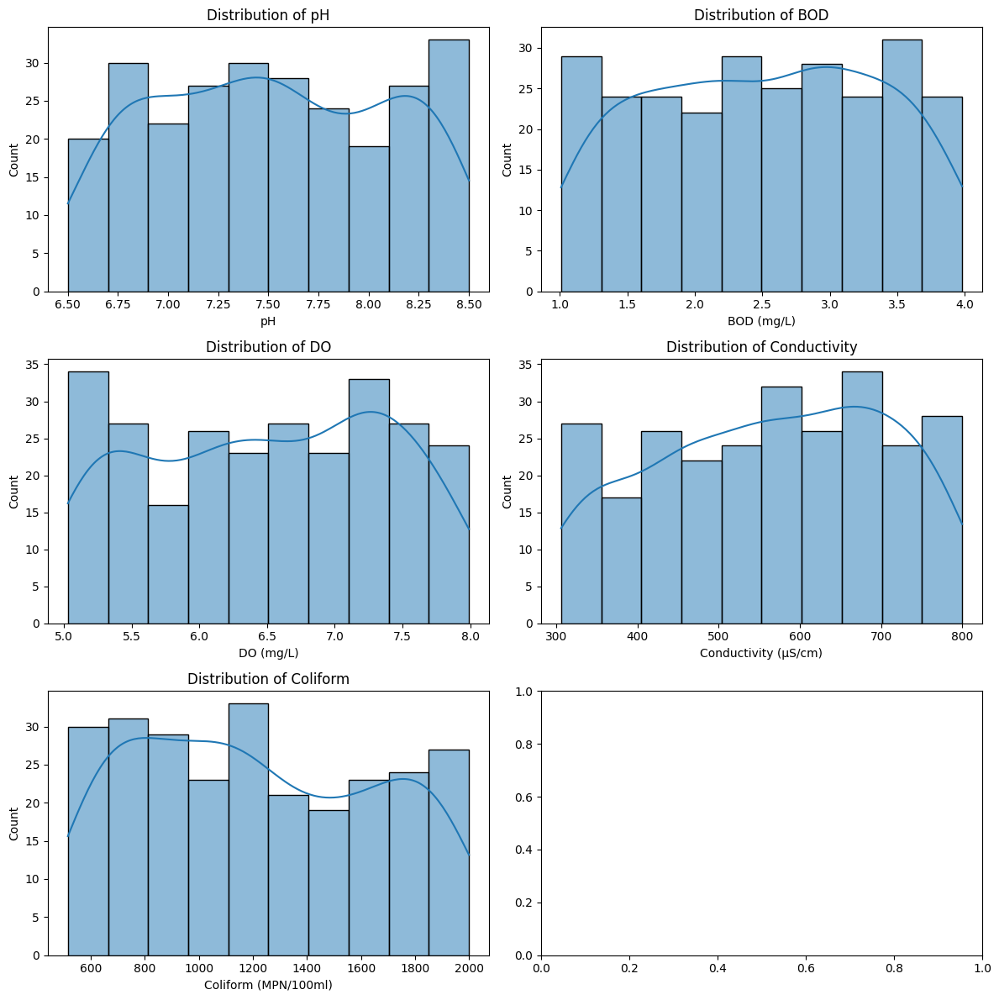

In [24]:
# Detecting outliers using Z-score (For each parameter)
z_scores = np.abs(stats.zscore(df[['pH', 'BOD (mg/L)', 'DO (mg/L)', 'Conductivity (µS/cm)', 'Coliform (MPN/100ml)']]))
outliers = (z_scores > 3).all(axis=1)

# Drop outliers
df_cleaned = df[~outliers]

fig, axes = plt.subplots(3, 2, figsize=(12, 12))

sns.histplot(df_cleaned['pH'], kde=True, ax=axes[0, 0])
axes[0, 0].set_title('Distribution of pH')

sns.histplot(df_cleaned['BOD (mg/L)'], kde=True, ax=axes[0, 1])
axes[0, 1].set_title('Distribution of BOD')

sns.histplot(df_cleaned['DO (mg/L)'], kde=True, ax=axes[1, 0])
axes[1, 0].set_title('Distribution of DO')

sns.histplot(df_cleaned['Conductivity (µS/cm)'], kde=True, ax=axes[1, 1])
axes[1, 1].set_title('Distribution of Conductivity')

sns.histplot(df_cleaned['Coliform (MPN/100ml)'], kde=True, ax=axes[2, 0])
axes[2, 0].set_title('Distribution of Coliform')

plt.tight_layout()
plt.show()


# Function to plot confusion matrix and accuracy for each parameter

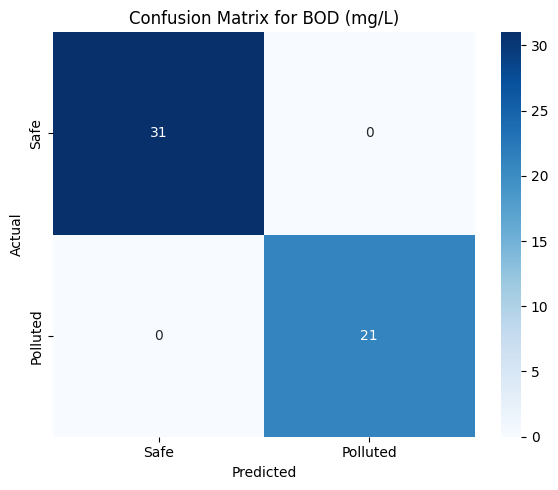

Accuracy for BOD (mg/L): 100.00%
Confusion Matrix for BOD (mg/L):
[[31  0]
 [ 0 21]]



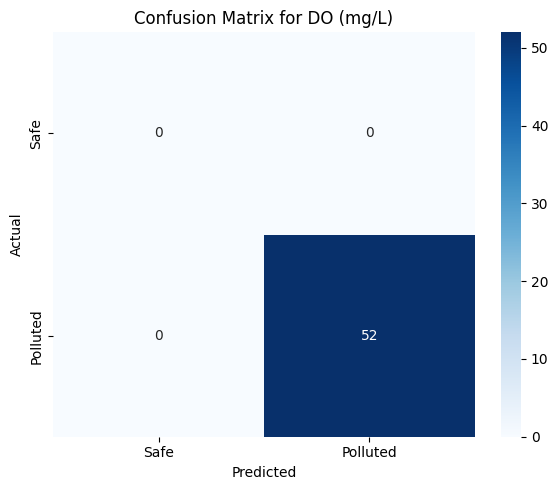

Accuracy for DO (mg/L): 100.00%
Confusion Matrix for DO (mg/L):
[[ 0  0]
 [ 0 52]]



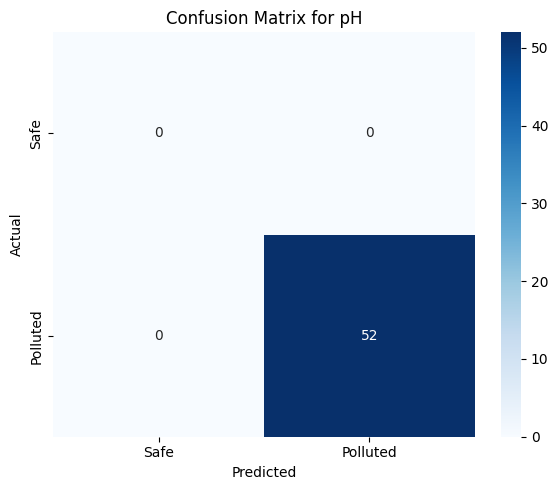

Accuracy for pH: 100.00%
Confusion Matrix for pH:
[[ 0  0]
 [ 0 52]]



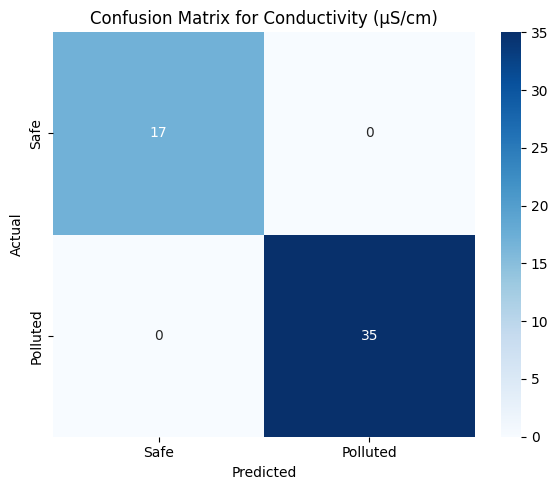

Accuracy for Conductivity (µS/cm): 100.00%
Confusion Matrix for Conductivity (µS/cm):
[[17  0]
 [ 0 35]]



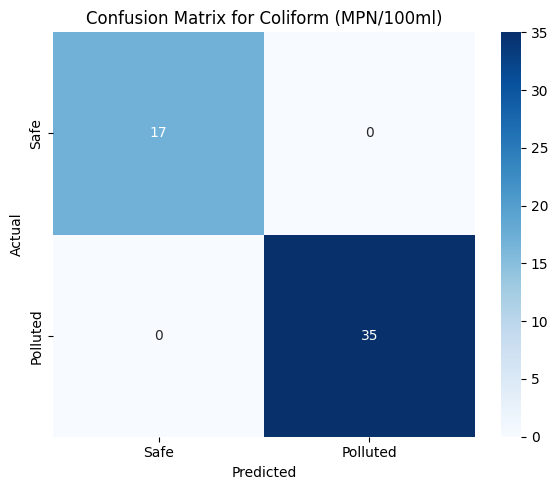

Accuracy for Coliform (MPN/100ml): 100.00%
Confusion Matrix for Coliform (MPN/100ml):
[[17  0]
 [ 0 35]]



In [ ]:
# Define the classification thresholds for each parameter
def classify_water_quality(df, parameter, threshold):
    return np.where(df[parameter] > threshold, "Polluted", "Safe")

# Example thresholds (you can adjust these based on domain knowledge)
thresholds = {
    'BOD (mg/L)': 3,  # For example, BOD > 3 is polluted
    'DO (mg/L)': 5,  # For example, DO < 5 is polluted
    'pH': 6.5,  # For example, pH < 6.5 or > 9 is polluted
    'Conductivity (µS/cm)': 500,  # For example, conductivity > 500 is polluted
    'Coliform (MPN/100ml)': 1000  # For example, Coliform > 1000 is polluted
}


def plot_confusion_matrix_and_accuracy(true_values, predicted_values, parameter):
    cm = confusion_matrix(true_values, predicted_values, labels=["Safe", "Polluted"])
    accuracy = accuracy_score(true_values, predicted_values)
    
    # Plot confusion matrix
    plt.figure(figsize=(6, 5))
    sns.heatmap(cm, annot=True, fmt="d", cmap='Blues', xticklabels=["Safe", "Polluted"], yticklabels=["Safe", "Polluted"])
    plt.title(f"Confusion Matrix for {parameter}")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.tight_layout()
    plt.show()
    
    # Print accuracy
    print(f"Accuracy for {parameter}: {accuracy * 100:.2f}%")
    return cm, accuracy

# Create the classification for each parameter (based on threshold)
for param, threshold in thresholds.items():
    state_avg[f'{param}_classification'] = classify_water_quality(state_avg, param, threshold)

# Split the dataset into training (80%) and testing (20%)
train_data, test_data = train_test_split(state_avg, test_size=0.2, random_state=42)

# Now, classify both training and testing data
for param, threshold in thresholds.items():
    # Classify the training and test data
    train_data[f'{param}_classification'] = classify_water_quality(train_data, param, threshold)
    test_data[f'{param}_classification'] = classify_water_quality(test_data, param, threshold)

    # Compare actual vs predicted on the test set
    true_values = test_data[f'{param}_classification']  # Actual values
    predicted_values = classify_water_quality(test_data, param, threshold)  # Predicted values

    # Plot confusion matrix and print accuracy
    cm, accuracy = plot_confusion_matrix_and_accuracy(true_values, predicted_values, param)
    print(f"Confusion Matrix for {param}:\n{cm}\n")


# Correlation Analysis for all parameters

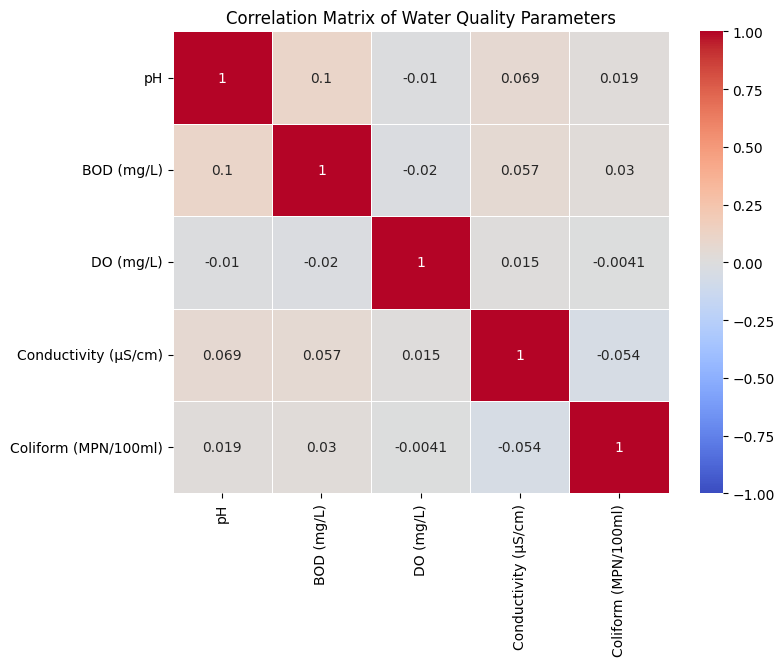

In [28]:
# Group by Year and State to get the average for each parameter
state_avg = df_cleaned.groupby(['Year', 'State']).mean().reset_index()


corr_matrix = state_avg[['pH', 'BOD (mg/L)', 'DO (mg/L)', 'Conductivity (µS/cm)', 'Coliform (MPN/100ml)']].corr()

# Plot Correlation Matrix to identify relationships
plt.figure(figsize=(8, 6))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1, linewidths=0.5)
plt.title("Correlation Matrix of Water Quality Parameters")
plt.show()




# Visualizing trends for each parameter across states (select a few states for clarity)

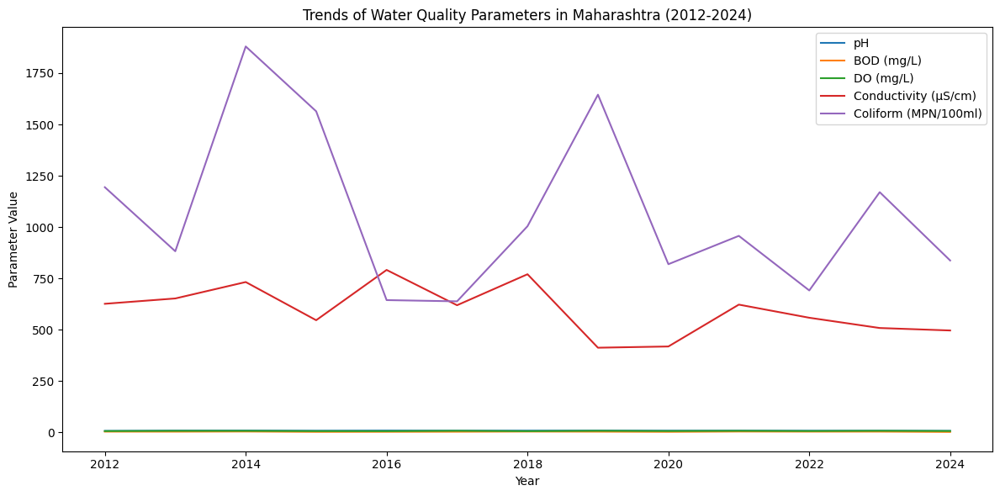

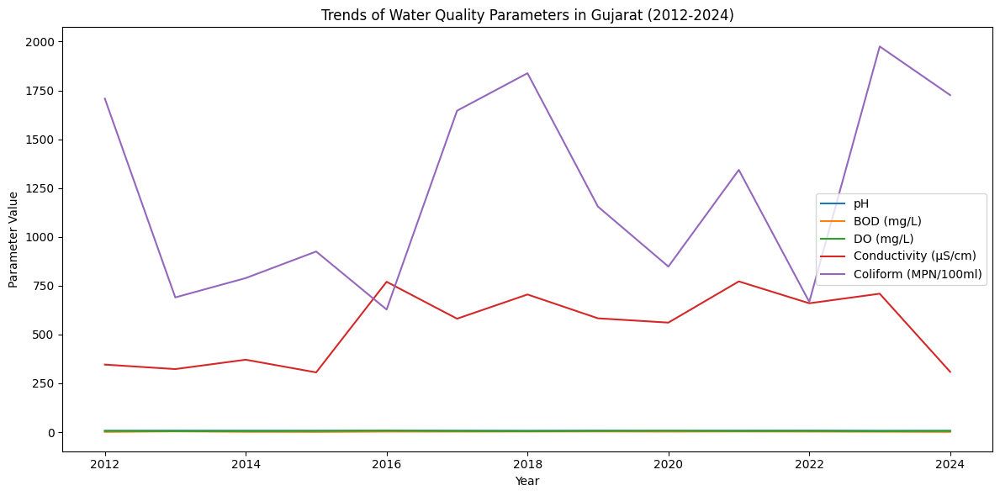

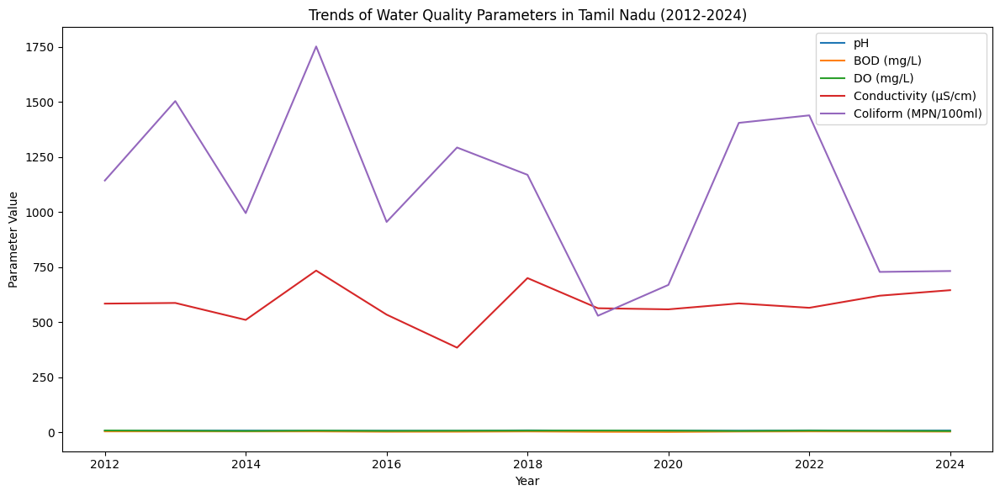

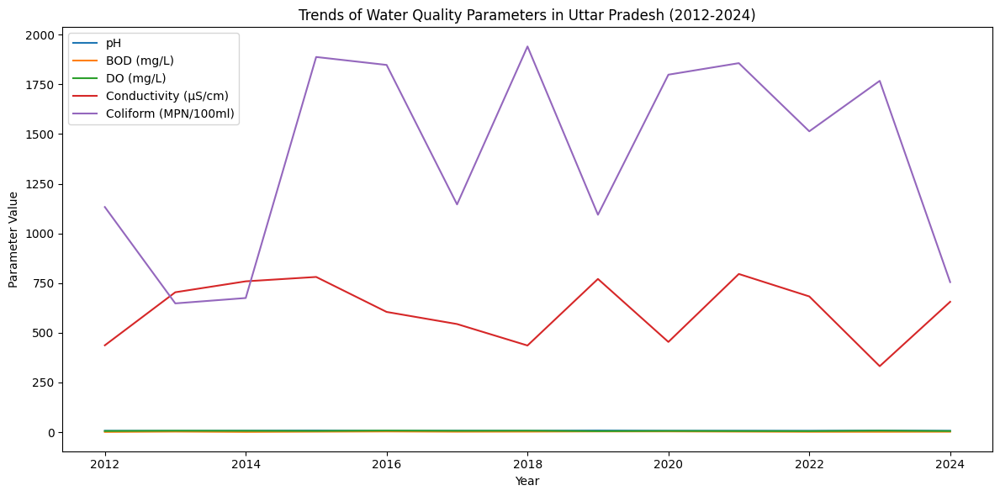

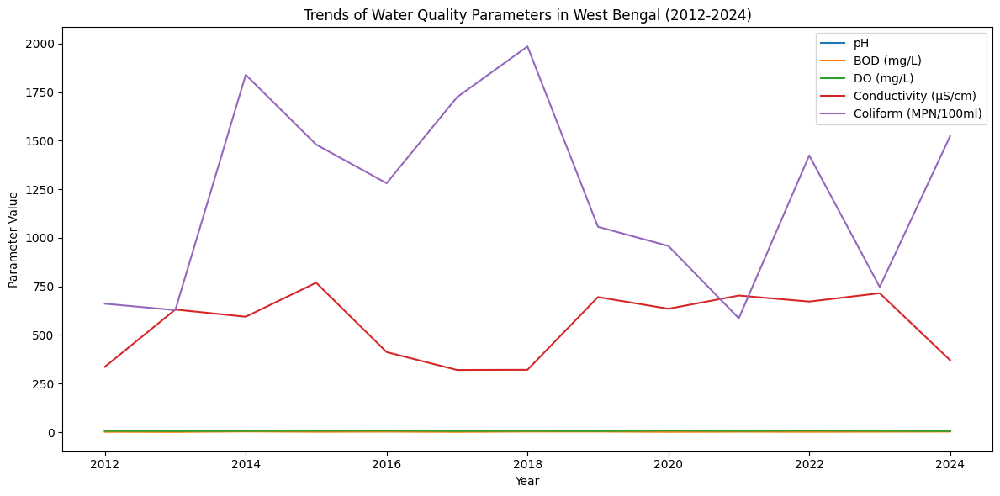

In [27]:

states_to_plot = ['Maharashtra', 'Gujarat', 'Tamil Nadu', 'Uttar Pradesh', 'West Bengal']

for state in states_to_plot:
    state_data = state_avg[state_avg['State'] == state]
    
    plt.figure(figsize=(12, 6))
    sns.lineplot(data=state_data, x='Year', y='pH', label='pH')
    sns.lineplot(data=state_data, x='Year', y='BOD (mg/L)', label='BOD (mg/L)')
    sns.lineplot(data=state_data, x='Year', y='DO (mg/L)', label='DO (mg/L)')
    sns.lineplot(data=state_data, x='Year', y='Conductivity (µS/cm)', label='Conductivity (µS/cm)')
    sns.lineplot(data=state_data, x='Year', y='Coliform (MPN/100ml)', label='Coliform (MPN/100ml)')
    
    plt.title(f"Trends of Water Quality Parameters in {state} (2012-2024)")
    plt.xlabel("Year")
    plt.ylabel("Parameter Value")
    plt.legend()
    plt.tight_layout()
    plt.show()

# Define the thresholds for safe and polluted water

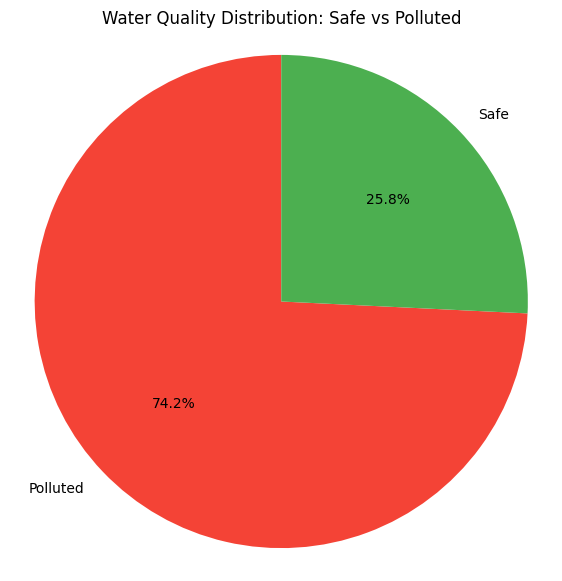

In [29]:
def categorize_water_safety(row):
    if row['BOD (mg/L)'] < 3 and row['Coliform (MPN/100ml)'] < 1000:  # Safe water condition
        return 'Safe'
    else:  # Polluted water condition
        return 'Polluted'

# Apply the categorization to the dataset
df['Water Status'] = df.apply(categorize_water_safety, axis=1)

# Calculate the count of safe vs polluted water
water_status_counts = df['Water Status'].value_counts()

# Create Pie chart
plt.figure(figsize=(7, 7))
plt.pie(water_status_counts, labels=water_status_counts.index, autopct='%1.1f%%', startangle=90, colors=['#F44336', '#4CAF50'])
plt.title('Water Quality Distribution: Safe vs Polluted')
plt.axis('equal')  # Equal aspect ratio ensures that pie chart is circular.
plt.show()


# **ARIMA model for forecasting**

C:\Users\Nikhil\AppData\Local\Temp\ipykernel_27408\1742895229.py:6: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  param_data = data[['Date', parameter]].set_index('Date').resample('A').mean()
C:\Users\Nikhil\AppData\Local\Temp\ipykernel_27408\1742895229.py:18: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  plt.plot(pd.date_range(start=param_data.index[-1], periods=steps + 1, freq='A')[1:], forecast, label='Forecasted Data', linestyle='--')


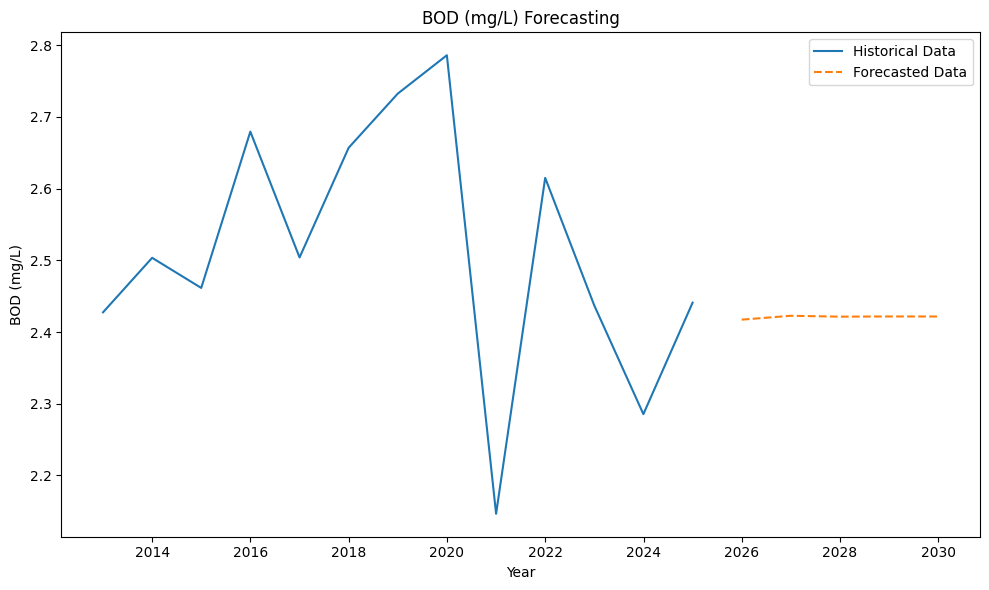

In [31]:
def forecast_with_arima(data, parameter, steps=5):
    # Convert the 'Year' column to a datetime index (set it to January 1st)
    data['Date'] = pd.to_datetime(data['Year'].astype(str) + '-01-01')

    # Filter data for the parameter
    param_data = data[['Date', parameter]].set_index('Date').resample('A').mean()
    
    
    model = ARIMA(param_data, order=(1, 1, 1))  # Adjust the order based on the data
    model_fit = model.fit()
    
    # Forecasting future values
    forecast = model_fit.forecast(steps=steps)
    
    # Plot the original data and forecast
    plt.figure(figsize=(10, 6))
    plt.plot(param_data, label='Historical Data')
    plt.plot(pd.date_range(start=param_data.index[-1], periods=steps + 1, freq='A')[1:], forecast, label='Forecasted Data', linestyle='--')
    plt.title(f'{parameter} Forecasting')
    plt.xlabel('Year')
    plt.ylabel(parameter)
    plt.legend()
    plt.tight_layout()
    plt.show()

# Example: Forecasting BOD for the next 5 years
forecast_with_arima(df_cleaned, 'BOD (mg/L)', steps=5)


# Plotting the original data and forecasted data

C:\Users\Nikhil\AppData\Local\Temp\ipykernel_27408\454258905.py:6: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  train_data = data[['Date', parameter]].set_index('Date').resample('A').mean()[:-steps]
C:\Users\Nikhil\AppData\Local\Temp\ipykernel_27408\454258905.py:7: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  test_data = data[['Date', parameter]].set_index('Date').resample('A').mean()[-steps:]
C:\Users\Nikhil\AppData\Local\Temp\ipykernel_27408\454258905.py:17: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  test_index = pd.date_range(start=train_data.index[-1], periods=steps + 1, freq='A')[1:]


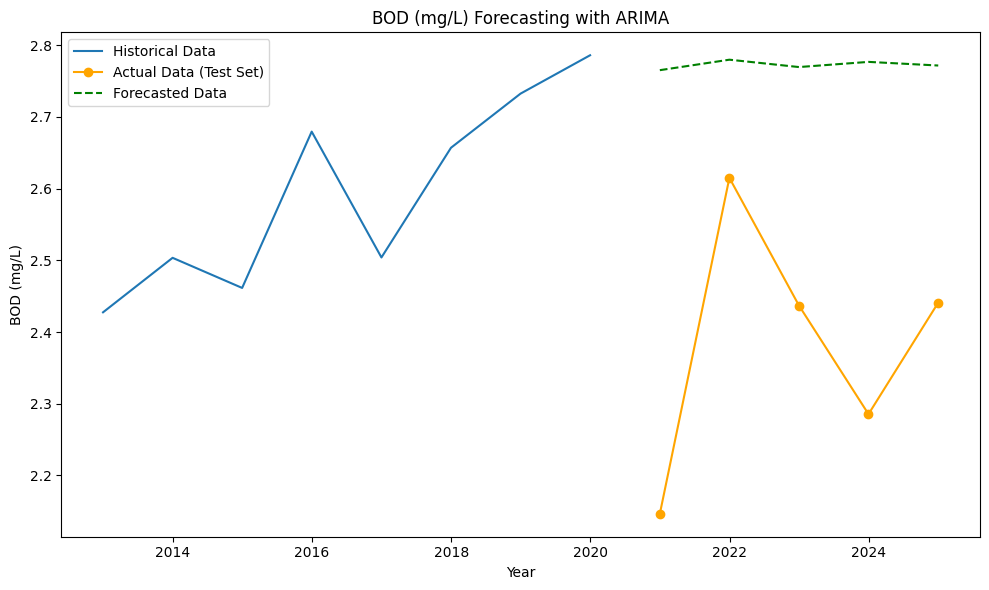

Forecasting for BOD (mg/L):
Mean Absolute Error (MAE): 0.38760281397198726
Mean Squared Error (MSE): 0.17424733173939383
Root Mean Squared Error (RMSE): 0.41742943324518195
Mean Absolute Percentage Error (MAPE): 0.16762830945043572



C:\Users\Nikhil\AppData\Local\Temp\ipykernel_27408\454258905.py:6: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  train_data = data[['Date', parameter]].set_index('Date').resample('A').mean()[:-steps]
C:\Users\Nikhil\AppData\Local\Temp\ipykernel_27408\454258905.py:7: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  test_data = data[['Date', parameter]].set_index('Date').resample('A').mean()[-steps:]
C:\Users\Nikhil\AppData\Roaming\Python\Python310\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\Nikhil\AppData\Local\Temp\ipykernel_27408\454258905.py:17: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  test_index = pd.date_range(start=train_data.index[-1], periods=steps

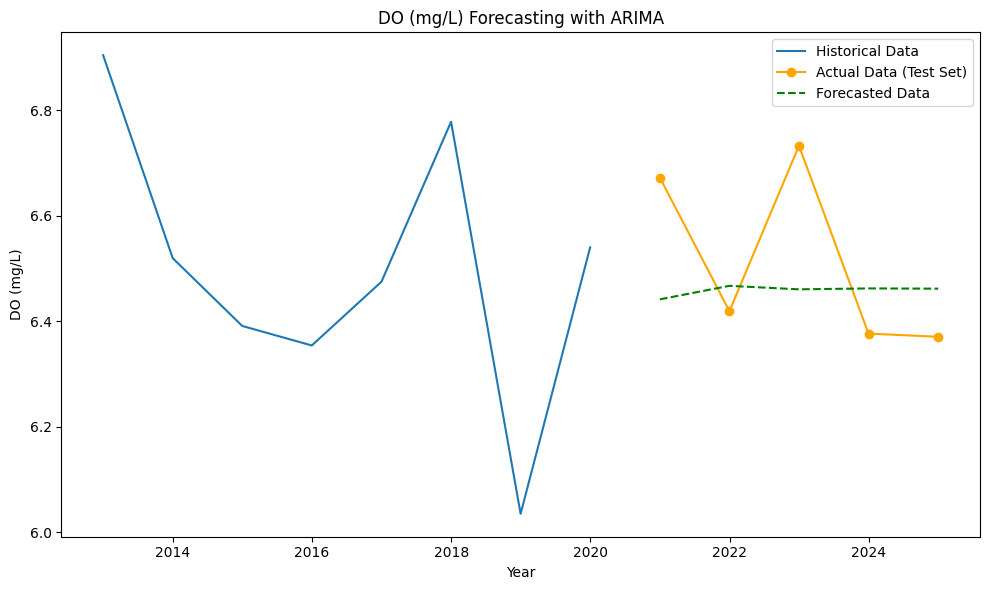

Forecasting for DO (mg/L):
Mean Absolute Error (MAE): 0.14549977832370117
Mean Squared Error (MSE): 0.029032012448732318
Root Mean Squared Error (RMSE): 0.17038782952057438
Mean Absolute Percentage Error (MAPE): 0.022039225321728147



C:\Users\Nikhil\AppData\Local\Temp\ipykernel_27408\454258905.py:6: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  train_data = data[['Date', parameter]].set_index('Date').resample('A').mean()[:-steps]
C:\Users\Nikhil\AppData\Local\Temp\ipykernel_27408\454258905.py:7: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  test_data = data[['Date', parameter]].set_index('Date').resample('A').mean()[-steps:]
C:\Users\Nikhil\AppData\Local\Temp\ipykernel_27408\454258905.py:17: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  test_index = pd.date_range(start=train_data.index[-1], periods=steps + 1, freq='A')[1:]


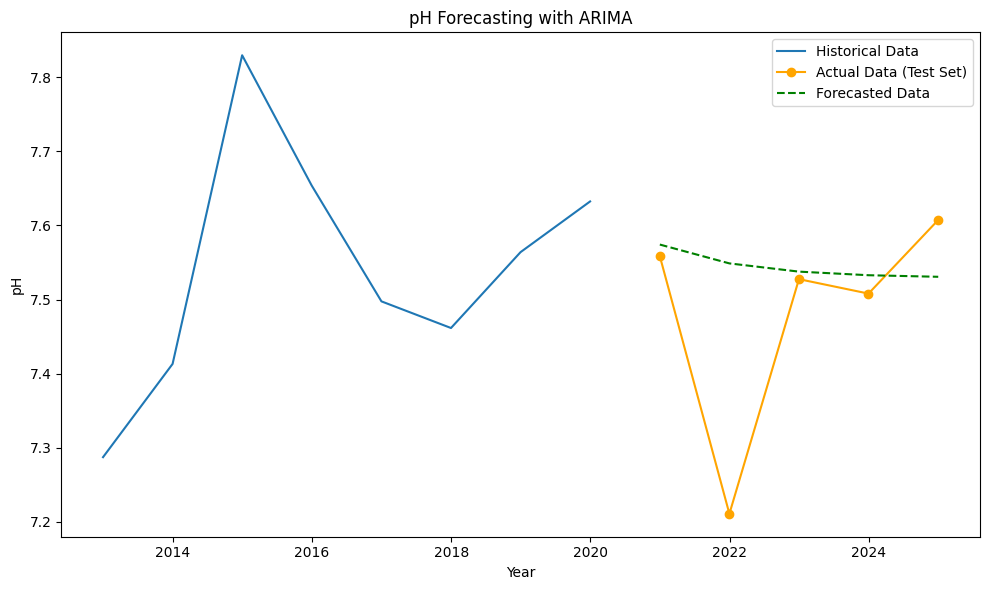

Forecasting for pH:
Mean Absolute Error (MAE): 0.0931688707997406
Mean Squared Error (MSE): 0.02426215174033983
Root Mean Squared Error (RMSE): 0.1557631270241447
Mean Absolute Percentage Error (MAPE): 0.012750831221561894



C:\Users\Nikhil\AppData\Local\Temp\ipykernel_27408\454258905.py:6: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  train_data = data[['Date', parameter]].set_index('Date').resample('A').mean()[:-steps]
C:\Users\Nikhil\AppData\Local\Temp\ipykernel_27408\454258905.py:7: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  test_data = data[['Date', parameter]].set_index('Date').resample('A').mean()[-steps:]
C:\Users\Nikhil\AppData\Local\Temp\ipykernel_27408\454258905.py:17: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  test_index = pd.date_range(start=train_data.index[-1], periods=steps + 1, freq='A')[1:]


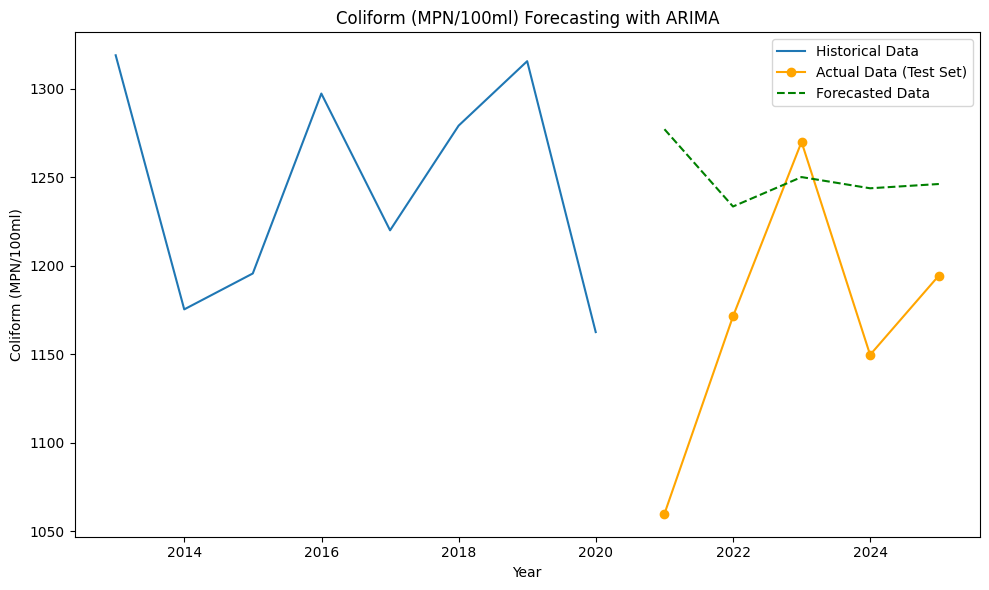

Forecasting for Coliform (MPN/100ml):
Mean Absolute Error (MAE): 89.08900946511963
Mean Squared Error (MSE): 12620.085390661256
Root Mean Squared Error (RMSE): 112.33915341794798
Mean Absolute Percentage Error (MAPE): 0.07983521170030032



In [33]:
def forecast_with_arima(data, parameter, steps=5):
    # Convert the 'Year' column to a datetime index (set it to January 1st)
    data['Date'] = pd.to_datetime(data['Year'].astype(str) + '-01-01')
    
    # Split the data into training and test set (use the last 3 years for testing)
    train_data = data[['Date', parameter]].set_index('Date').resample('A').mean()[:-steps]
    test_data = data[['Date', parameter]].set_index('Date').resample('A').mean()[-steps:]

    # ARIMA model for forecasting (adjust order based on parameter)
    model = ARIMA(train_data, order=(1, 1, 1))  # Adjust the order if needed
    model_fit = model.fit()

    # Forecasting future values
    forecast = model_fit.forecast(steps=steps)

    # Evaluate model performance on the test data
    test_index = pd.date_range(start=train_data.index[-1], periods=steps + 1, freq='A')[1:]

    # Plotting the original data and forecasted data
    plt.figure(figsize=(10, 6))
    plt.plot(train_data, label='Historical Data')
    plt.plot(test_index, test_data, label='Actual Data (Test Set)', color='orange', marker='o')
    plt.plot(test_index, forecast, label='Forecasted Data', linestyle='--', color='green')
    plt.title(f'{parameter} Forecasting with ARIMA')
    plt.xlabel('Year')
    plt.ylabel(parameter)
    plt.legend()
    plt.tight_layout()
    plt.show()

    # Model Evaluation Metrics
    mae = mean_absolute_error(test_data, forecast)
    mse = mean_squared_error(test_data, forecast)
    rmse = np.sqrt(mse)  # Manually calculate RMSE
    mape = mean_absolute_percentage_error(test_data, forecast)

    print(f'Forecasting for {parameter}:')
    print(f'Mean Absolute Error (MAE): {mae}')
    print(f'Mean Squared Error (MSE): {mse}')
    print(f'Root Mean Squared Error (RMSE): {rmse}')
    print(f'Mean Absolute Percentage Error (MAPE): {mape}\n')

# Forecast and evaluate for multiple parameters
parameters = ['BOD (mg/L)', 'DO (mg/L)', 'pH', 'Coliform (MPN/100ml)']
for param in parameters:
    forecast_with_arima(df_cleaned, param, steps=5)


C:\Users\Nikhil\AppData\Local\Temp\ipykernel_27408\454258905.py:6: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  train_data = data[['Date', parameter]].set_index('Date').resample('A').mean()[:-steps]
C:\Users\Nikhil\AppData\Local\Temp\ipykernel_27408\454258905.py:7: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  test_data = data[['Date', parameter]].set_index('Date').resample('A').mean()[-steps:]
C:\Users\Nikhil\AppData\Local\Temp\ipykernel_27408\454258905.py:17: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  test_index = pd.date_range(start=train_data.index[-1], periods=steps + 1, freq='A')[1:]


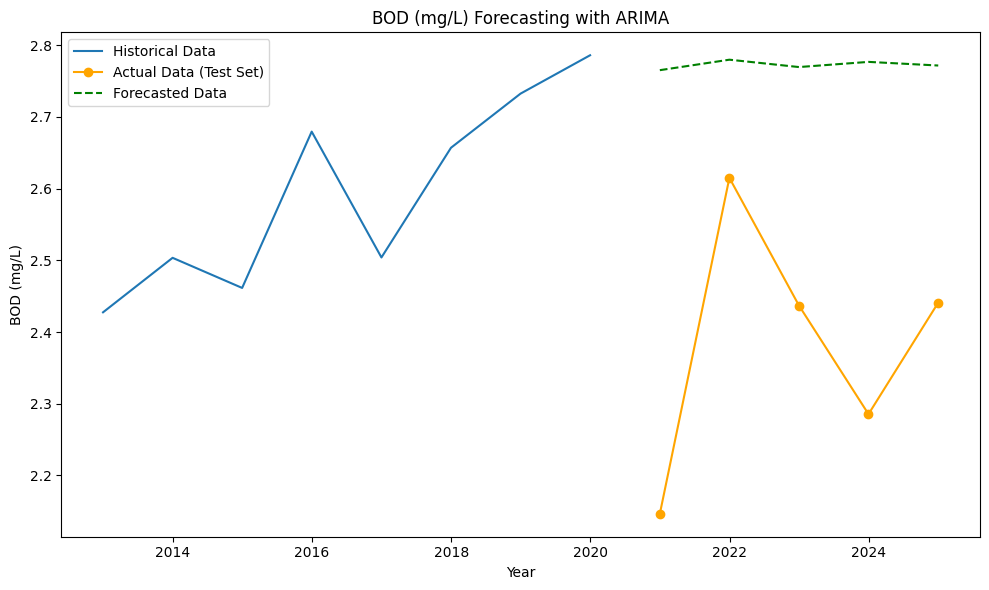

Forecasting for BOD (mg/L):
Mean Absolute Error (MAE): 0.38760281397198726
Mean Squared Error (MSE): 0.17424733173939383
Root Mean Squared Error (RMSE): 0.41742943324518195
Mean Absolute Percentage Error (MAPE): 0.16762830945043572



C:\Users\Nikhil\AppData\Local\Temp\ipykernel_27408\454258905.py:6: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  train_data = data[['Date', parameter]].set_index('Date').resample('A').mean()[:-steps]
C:\Users\Nikhil\AppData\Local\Temp\ipykernel_27408\454258905.py:7: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  test_data = data[['Date', parameter]].set_index('Date').resample('A').mean()[-steps:]
C:\Users\Nikhil\AppData\Roaming\Python\Python310\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\Nikhil\AppData\Local\Temp\ipykernel_27408\454258905.py:17: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  test_index = pd.date_range(start=train_data.index[-1], periods=steps

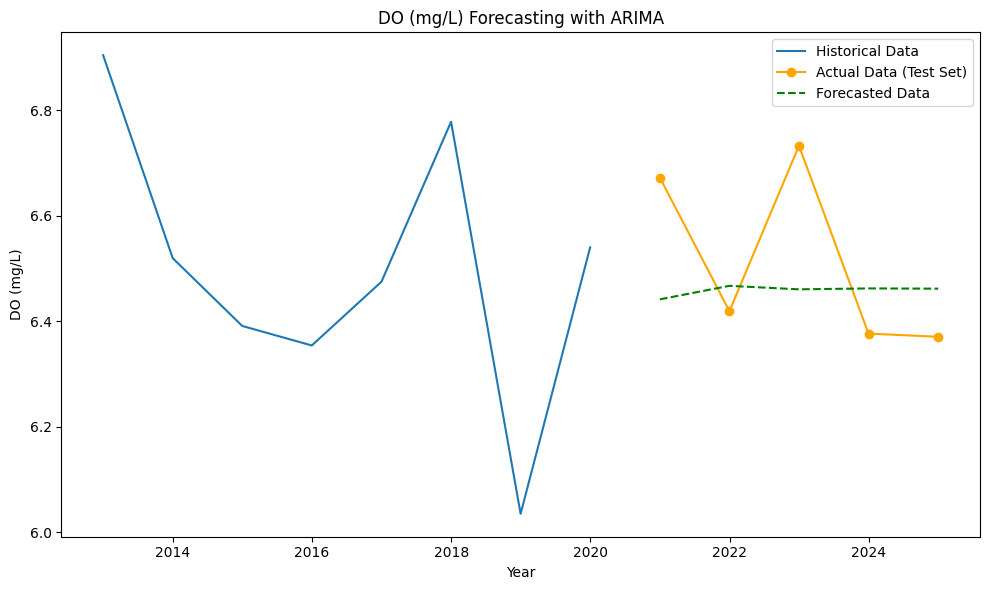

Forecasting for DO (mg/L):
Mean Absolute Error (MAE): 0.14549977832370117
Mean Squared Error (MSE): 0.029032012448732318
Root Mean Squared Error (RMSE): 0.17038782952057438
Mean Absolute Percentage Error (MAPE): 0.022039225321728147



C:\Users\Nikhil\AppData\Local\Temp\ipykernel_27408\454258905.py:6: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  train_data = data[['Date', parameter]].set_index('Date').resample('A').mean()[:-steps]
C:\Users\Nikhil\AppData\Local\Temp\ipykernel_27408\454258905.py:7: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  test_data = data[['Date', parameter]].set_index('Date').resample('A').mean()[-steps:]
C:\Users\Nikhil\AppData\Local\Temp\ipykernel_27408\454258905.py:17: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  test_index = pd.date_range(start=train_data.index[-1], periods=steps + 1, freq='A')[1:]


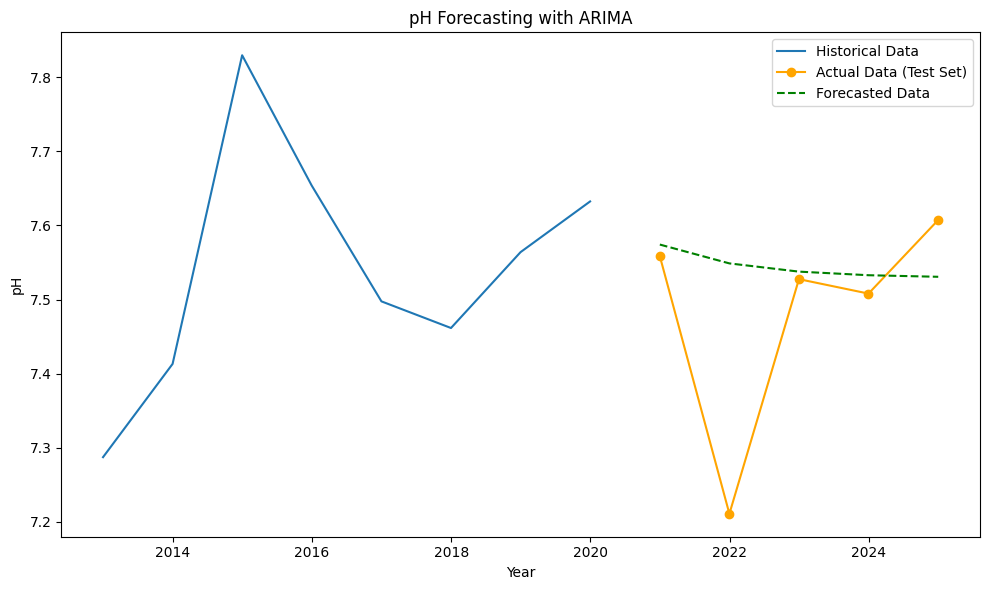

Forecasting for pH:
Mean Absolute Error (MAE): 0.0931688707997406
Mean Squared Error (MSE): 0.02426215174033983
Root Mean Squared Error (RMSE): 0.1557631270241447
Mean Absolute Percentage Error (MAPE): 0.012750831221561894



C:\Users\Nikhil\AppData\Local\Temp\ipykernel_27408\454258905.py:6: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  train_data = data[['Date', parameter]].set_index('Date').resample('A').mean()[:-steps]
C:\Users\Nikhil\AppData\Local\Temp\ipykernel_27408\454258905.py:7: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  test_data = data[['Date', parameter]].set_index('Date').resample('A').mean()[-steps:]
C:\Users\Nikhil\AppData\Local\Temp\ipykernel_27408\454258905.py:17: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  test_index = pd.date_range(start=train_data.index[-1], periods=steps + 1, freq='A')[1:]


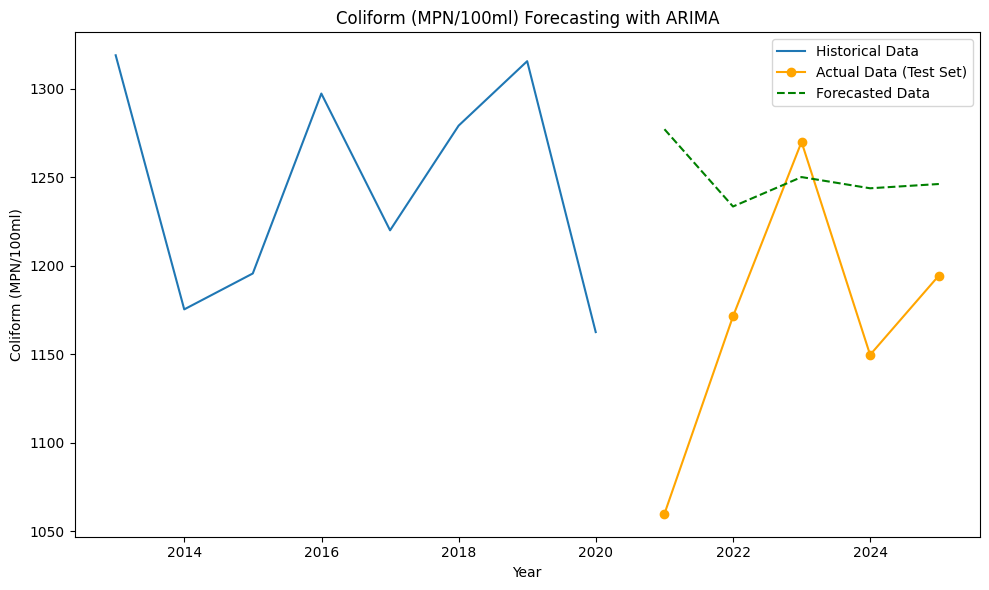

Forecasting for Coliform (MPN/100ml):
Mean Absolute Error (MAE): 89.08900946511963
Mean Squared Error (MSE): 12620.085390661256
Root Mean Squared Error (RMSE): 112.33915341794798
Mean Absolute Percentage Error (MAPE): 0.07983521170030032



In [34]:
def forecast_with_arima(data, parameter, steps=5):
    # Convert the 'Year' column to a datetime index (set it to January 1st)
    data['Date'] = pd.to_datetime(data['Year'].astype(str) + '-01-01')
    
    # Split the data into training and test set (use the last 3 years for testing)
    train_data = data[['Date', parameter]].set_index('Date').resample('A').mean()[:-steps]
    test_data = data[['Date', parameter]].set_index('Date').resample('A').mean()[-steps:]

    # ARIMA model for forecasting (adjust order based on parameter)
    model = ARIMA(train_data, order=(1, 1, 1))  # Adjust the order if needed
    model_fit = model.fit()

    # Forecasting future values
    forecast = model_fit.forecast(steps=steps)

    # Evaluate model performance on the test data
    test_index = pd.date_range(start=train_data.index[-1], periods=steps + 1, freq='A')[1:]

    # Plotting the original data and forecasted data
    plt.figure(figsize=(10, 6))
    plt.plot(train_data, label='Historical Data')
    plt.plot(test_index, test_data, label='Actual Data (Test Set)', color='orange', marker='o')
    plt.plot(test_index, forecast, label='Forecasted Data', linestyle='--', color='green')
    plt.title(f'{parameter} Forecasting with ARIMA')
    plt.xlabel('Year')
    plt.ylabel(parameter)
    plt.legend()
    plt.tight_layout()
    plt.show()

    # Model Evaluation Metrics
    mae = mean_absolute_error(test_data, forecast)
    mse = mean_squared_error(test_data, forecast)
    rmse = np.sqrt(mse)  # Manually calculate RMSE
    mape = mean_absolute_percentage_error(test_data, forecast)

    print(f'Forecasting for {parameter}:')
    print(f'Mean Absolute Error (MAE): {mae}')
    print(f'Mean Squared Error (MSE): {mse}')
    print(f'Root Mean Squared Error (RMSE): {rmse}')
    print(f'Mean Absolute Percentage Error (MAPE): {mape}\n')

# Forecast and evaluate for multiple parameters
parameters = ['BOD (mg/L)', 'DO (mg/L)', 'pH', 'Coliform (MPN/100ml)']
for param in parameters:
    forecast_with_arima(df_cleaned, param, steps=5)


C:\Users\Nikhil\AppData\Local\Temp\ipykernel_27408\153089622.py:6: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  param_data = data[['Date', parameter]].set_index('Date').resample('A').mean()
C:\Users\Nikhil\AppData\Roaming\Python\Python310\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\Nikhil\AppData\Local\Temp\ipykernel_27408\153089622.py:20: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  forecast_index = pd.date_range(start=param_data.index[-1], periods=steps + 1, freq='A')[1:]


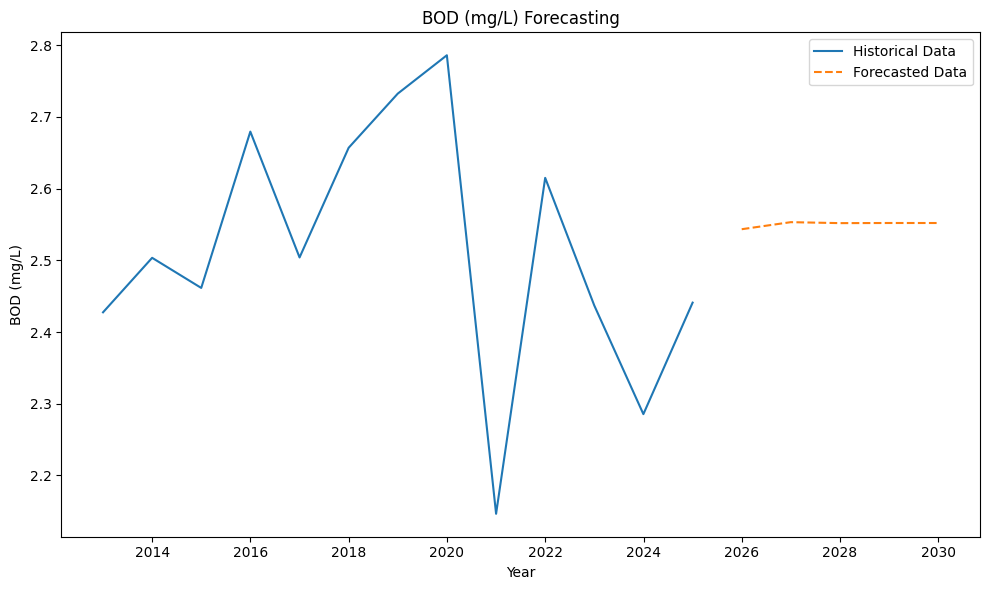


Forecasting for BOD (mg/L):
Mean Absolute Error (MAE): 0.37474782368334114
Mean Squared Error (MSE): 0.6242979544522054
Root Mean Squared Error (RMSE): 0.7901252776947497
Mean Absolute Percentage Error (MAPE): 0.15294383469197095

Forecast for BOD (mg/L) for the next 5 years:
           Forecasted BOD (mg/L)
2025-12-31                   NaN
2026-12-31                   NaN
2027-12-31                   NaN
2028-12-31                   NaN
2029-12-31                   NaN


C:\Users\Nikhil\AppData\Local\Temp\ipykernel_27408\153089622.py:6: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  param_data = data[['Date', parameter]].set_index('Date').resample('A').mean()
C:\Users\Nikhil\AppData\Roaming\Python\Python310\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\Nikhil\AppData\Local\Temp\ipykernel_27408\153089622.py:20: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  forecast_index = pd.date_range(start=param_data.index[-1], periods=steps + 1, freq='A')[1:]


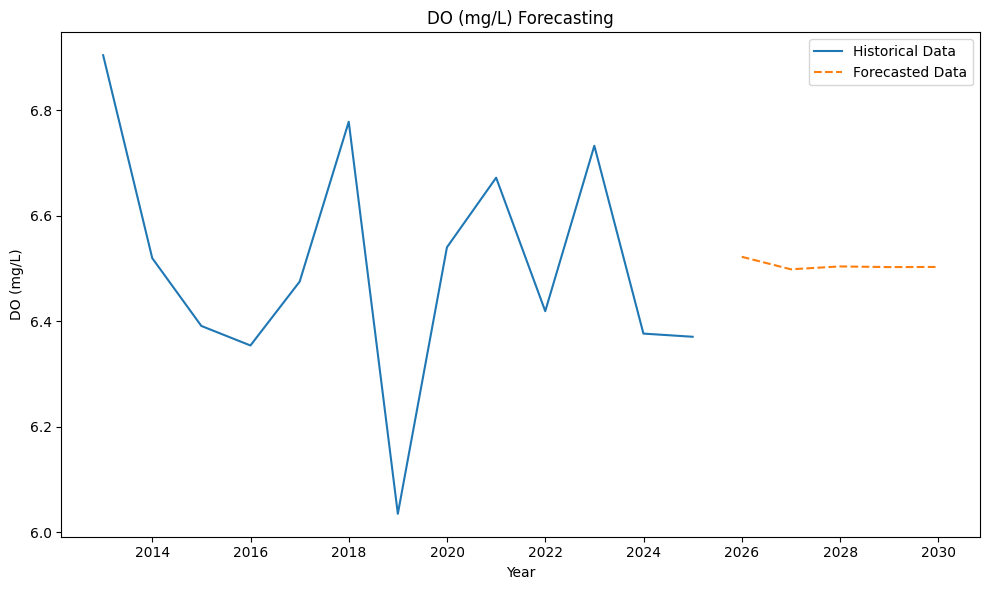


Forecasting for DO (mg/L):
Mean Absolute Error (MAE): 0.9069872705031585
Mean Squared Error (MSE): 4.836655189292419
Root Mean Squared Error (RMSE): 2.19923968436649
Mean Absolute Percentage Error (MAPE): 0.133827047080566

Forecast for DO (mg/L) for the next 5 years:
           Forecasted DO (mg/L)
2025-12-31                  NaN
2026-12-31                  NaN
2027-12-31                  NaN
2028-12-31                  NaN
2029-12-31                  NaN


C:\Users\Nikhil\AppData\Local\Temp\ipykernel_27408\153089622.py:6: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  param_data = data[['Date', parameter]].set_index('Date').resample('A').mean()
C:\Users\Nikhil\AppData\Local\Temp\ipykernel_27408\153089622.py:20: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  forecast_index = pd.date_range(start=param_data.index[-1], periods=steps + 1, freq='A')[1:]


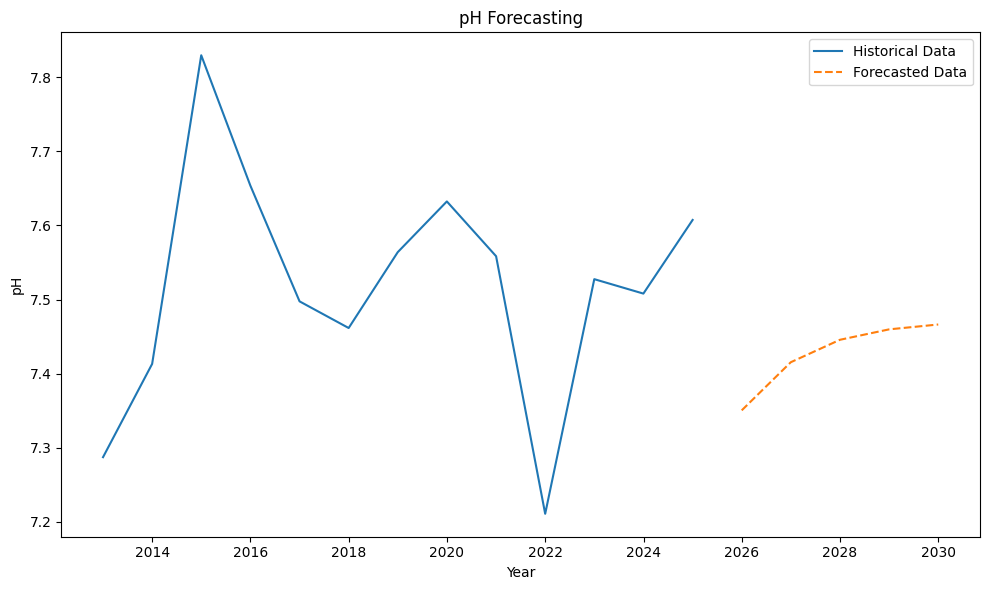


Forecasting for pH:
Mean Absolute Error (MAE): 0.8534510210737171
Mean Squared Error (MSE): 5.34547231572143
Root Mean Squared Error (RMSE): 2.3120277497732222
Mean Absolute Percentage Error (MAPE): 0.11654117127106041

Forecast for pH for the next 5 years:
           Forecasted pH
2025-12-31           NaN
2026-12-31           NaN
2027-12-31           NaN
2028-12-31           NaN
2029-12-31           NaN


C:\Users\Nikhil\AppData\Local\Temp\ipykernel_27408\153089622.py:6: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  param_data = data[['Date', parameter]].set_index('Date').resample('A').mean()
C:\Users\Nikhil\AppData\Local\Temp\ipykernel_27408\153089622.py:20: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  forecast_index = pd.date_range(start=param_data.index[-1], periods=steps + 1, freq='A')[1:]


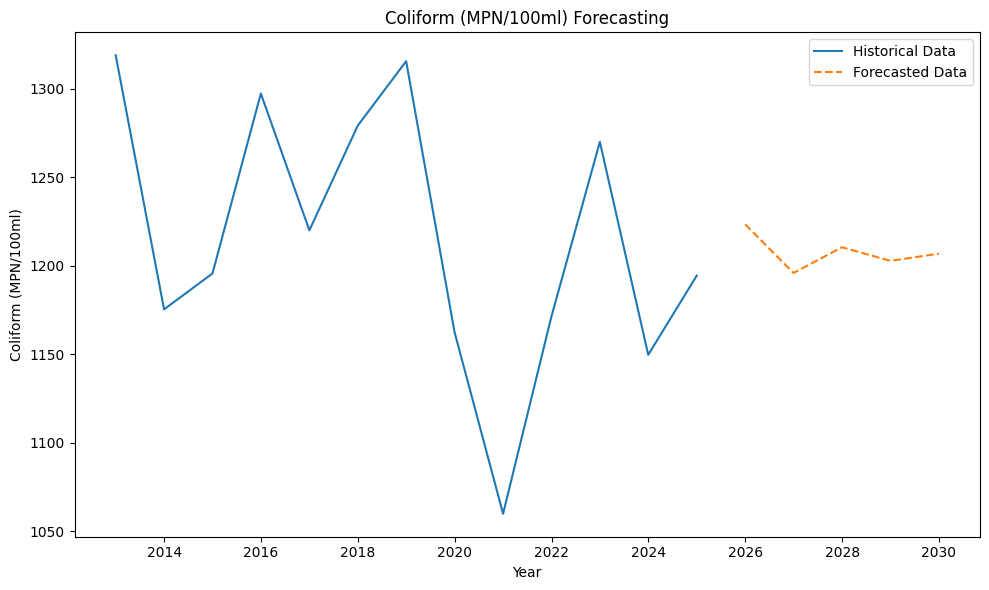


Forecasting for Coliform (MPN/100ml):
Mean Absolute Error (MAE): 208.1196874551618
Mean Squared Error (MSE): 181847.10885281884
Root Mean Squared Error (RMSE): 426.4353513169597
Mean Absolute Percentage Error (MAPE): 0.16410296878363978

Forecast for Coliform (MPN/100ml) for the next 5 years:
           Forecasted Coliform (MPN/100ml)
2025-12-31                             NaN
2026-12-31                             NaN
2027-12-31                             NaN
2028-12-31                             NaN
2029-12-31                             NaN


In [35]:
def forecast_with_arima(data, parameter, steps=5):
    # Convert the 'Year' column to a datetime index (set it to January 1st)
    data['Date'] = pd.to_datetime(data['Year'].astype(str) + '-01-01')
    
    # Filter data for the parameter
    param_data = data[['Date', parameter]].set_index('Date').resample('A').mean()
    
    # Split the data into training and testing sets (use the last 3 years as test set)
    train_data = param_data.iloc[:-3]
    test_data = param_data.iloc[-3:]
    
    # ARIMA model for forecasting
    model = ARIMA(train_data, order=(1, 1, 1))  # Adjust the order based on the data
    model_fit = model.fit()
    
    # Forecasting future values
    forecast = model_fit.forecast(steps=steps)
    
    # Generate the index for the forecast years (future years like 2025, 2026, etc.)
    forecast_index = pd.date_range(start=param_data.index[-1], periods=steps + 1, freq='A')[1:]
    
    # Plot the original data and forecast
    plt.figure(figsize=(10, 6))
    plt.plot(param_data, label='Historical Data')
    plt.plot(forecast_index, forecast, label='Forecasted Data', linestyle='--')
    plt.title(f'{parameter} Forecasting')
    plt.xlabel('Year')
    plt.ylabel(parameter)
    plt.legend()
    plt.tight_layout()
    plt.show()
    
    # Calculate and print forecasting errors for training data
    train_forecast = model_fit.predict(start=train_data.index[0], end=train_data.index[-1], dynamic=False)
    
    mae = mean_absolute_error(train_data, train_forecast)
    mse = mean_squared_error(train_data, train_forecast)
    rmse = np.sqrt(mse)  # Manually calculating RMSE
    mape = mean_absolute_percentage_error(train_data, train_forecast)
    
    print(f"\nForecasting for {parameter}:")
    print(f"Mean Absolute Error (MAE): {mae}")
    print(f"Mean Squared Error (MSE): {mse}")
    print(f"Root Mean Squared Error (RMSE): {rmse}")
    print(f"Mean Absolute Percentage Error (MAPE): {mape}")
    
    # Print forecast values for future years
    forecast_df = pd.DataFrame(forecast, index=forecast_index, columns=[f'Forecasted {parameter}'])
    print(f"\nForecast for {parameter} for the next {steps} years:")
    print(forecast_df)

# Forecast for multiple parameters
parameters = ['BOD (mg/L)', 'DO (mg/L)', 'pH', 'Coliform (MPN/100ml)']
for param in parameters:
    forecast_with_arima(df_cleaned, param, steps=5)


In [36]:
import folium
from folium.plugins import HeatMap

# Plot data points on the map

In [37]:
# Create a map centered around India
map_center = [20.5937, 78.9629]  # Approximate center of India
water_quality_map = folium.Map(location=map_center, zoom_start=5)

# Plot data points on the map
for _, row in df_cleaned.iterrows():
    lat = row['Latitude']
    lon = row['Longitude']
    pH = row['pH']
    BOD = row['BOD (mg/L)']
    Coliform = row['Coliform (MPN/100ml)']
    
    # Use CircleMarker to show the data points
    folium.CircleMarker(
        location=[lat, lon],
        radius=7,
        color='blue',  # Adjust color based on parameter
        fill=True,
        fill_color='blue',
        fill_opacity=0.5,
        popup=f"State: {row['State']}<br>pH: {pH}<br>BOD: {BOD}<br>Coliform: {Coliform}"
    ).add_to(water_quality_map)

# Show the map
water_quality_map


In [38]:
# Example states known for major rivers
river_states = {
    'Ganges': ['Uttar Pradesh', 'West Bengal', 'Bihar'],
    'Yamuna': ['Haryana', 'Uttar Pradesh'],
    'Brahmaputra': ['Assam'],
    'Indus': ['Punjab']
}

# Assign river names based on state (you can expand this)
df_cleaned['River'] = df_cleaned['State'].apply(lambda state: next((river for river, states in river_states.items() if state in states), 'Unknown'))

# Now, we can filter for river data
river_data = df_cleaned[df_cleaned['River'] != 'Unknown']


In [39]:
import folium

# Create a map centered around India
map_center = [20.5937, 78.9629]  # Approximate center of India
river_quality_map = folium.Map(location=map_center, zoom_start=5)

# Plot river water quality data on the map (based on latitude/longitude)
for _, row in river_data.iterrows():
    lat = row['Latitude']
    lon = row['Longitude']
    pH = row['pH']
    BOD = row['BOD (mg/L)']
    Coliform = row['Coliform (MPN/100ml)']
    river = row['River']
    
    # Add markers for river locations
    folium.Marker(
        location=[lat, lon],
        popup=f"River: {river}<br>pH: {pH}<br>BOD: {BOD}<br>Coliform: {Coliform}",
        icon=folium.Icon(color='blue', icon='cloud')
    ).add_to(river_quality_map)

# Show the map
river_quality_map


In [40]:
# Function to assign color based on pollution level
def get_pollution_color(value):
    if value > 5:  # High pollution threshold
        return 'red'
    elif 2 <= value <= 5:  # Moderate pollution threshold
        return 'yellow'
    else:
        return 'green'  # Low pollution

# Create map centered around India
m = folium.Map(location=[20.5937, 78.9629], zoom_start=5)

# Adding pollution markers for each river station
for index, row in df.iterrows():
    # Get color based on pollution level (for BOD as an example)
    color = get_pollution_color(row['BOD (mg/L)'])
    
    # Add marker
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=8,
        color=color,
        fill=True,
        fill_color=color,
        fill_opacity=0.6,
        popup=f"State: {row['State']}<br>Water Pollution Level: {row['BOD (mg/L)']}",
    ).add_to(m)

# Save map as an HTML file
m.save('river_pollution_map.html')
m


In [73]:
import pandas as pd

# Define the parameters and their corresponding weights
weights = {
    'BOD (mg/L)': 0.3,
    'DO (mg/L)': 0.3,
    'pH': 0.1,
    'Coliform (MPN/100ml)': 0.2,
    'Conductivity (µS/cm)': 0.1
}

# Function to normalize values to the range 0-100
def normalize(df, column, min_value, max_value):
    return (df[column] - min_value) / (max_value - min_value) * 100

# Normalize each parameter and calculate the WQI
df_cleaned['BOD_norm'] = normalize(df_cleaned, 'BOD (mg/L)', 0, 10)
df_cleaned['DO_norm'] = normalize(df_cleaned, 'DO (mg/L)', 0, 20)
df_cleaned['pH_norm'] = normalize(df_cleaned, 'pH', 6, 9)
df_cleaned['Coliform_norm'] = normalize(df_cleaned, 'Coliform (MPN/100ml)', 0, 1000)
df_cleaned['Conductivity_norm'] = normalize(df_cleaned, 'Conductivity (µS/cm)', 0, 1000)

# Calculate WQI
df_cleaned['WQI'] = (df_cleaned['BOD_norm'] * weights['BOD (mg/L)'] +
                     df_cleaned['DO_norm'] * weights['DO (mg/L)'] +
                     df_cleaned['pH_norm'] * weights['pH'] +
                     df_cleaned['Coliform_norm'] * weights['Coliform (MPN/100ml)'] +
                     df_cleaned['Conductivity_norm'] * weights['Conductivity (µS/cm)'])

# Show the WQI results
print(df_cleaned[['Year', 'State', 'WQI']].head())


   Year          State        WQI
0  2012    Maharashtra  50.158333
1  2012        Gujarat  54.733333
2  2012         Kerala  60.728333
3  2012     Tamil Nadu  53.268333
4  2012  Uttar Pradesh  41.626667
